# BC3409 Project

## Content 

1. Data Preparation
2. Hyperparameter Tuning 
3. Portfolio Optimization 
4. Backtesting 
5. Return Attribution
6. Dashboard Deployment 

## 1. Data Preparation

In [1]:
import numpy as np
import pandas as pd 
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import sklearn.mixture as mix
import seaborn as sns

from matplotlib.dates import YearLocator, MonthLocator

import shap
from more_itertools import windowed
from tqdm.notebook import tqdm
import ipywidgets as widgets
widgets.IntSlider()

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, log_loss
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import lightgbm as lgb

from pyomo.environ import *
from pyomo import *

import optuna
from optuna.integration import LightGBMPruningCallback

import statsmodels.api as sm
import pandas_datareader.data as reader
import matplotlib.pyplot as plt

pd.set_option('display.max_rows', 50)
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
def convert_to_multiindex(df):
    df = df.groupby(level=0).apply(lambda x: x.set_index('date').resample('1M').last())
    df = df.reset_index()
    df = df.set_index(['date','ticker']).sort_index()
    return df

def rolling_returns(df, roll_list, col_list):
    temp = pd.DataFrame(index=df.index)
    with tqdm(total=len(col_list)*len(roll_list)) as pbar:
        for col in col_list:
            for roll in roll_list:
                roll_col_name = f'rolling_{col}_{roll}M'
                rolled_col = df[col].unstack().pct_change(roll).stack()
                temp[roll_col_name] = rolled_col
                pbar.update(1)

    longest_roll = max(roll_list)           
    mask = df.index.get_level_values(0).unique()[longest_roll]        
    temp = temp.loc[mask:]  
    df = df.join(temp, how = 'right')
    return df

### 1.1 Load data 

#### Sharadar Data

In [3]:
%%time
financials_raw = pd.read_csv('data/financials.csv', parse_dates=['date'])
sec_master_raw = pd.read_csv('data/sec_master.csv')
sep_raw = pd.read_csv('data/sep.csv', parse_dates=['date'])
sf1_raw = pd.read_csv('data/sf1.csv', parse_dates=['calendardate'])
sp500_constituents_raw = pd.read_csv('data/sp500_constituents.csv', parse_dates=['date'])

sec_master_raw = sec_master_raw.set_index('ticker') # Align ticker index
sf1_raw.rename(columns={'calendardate':'date'}, inplace=True)

Wall time: 20 s


#### Macro Data

In [4]:
%%time
rates_raw = pd.read_csv('data/rates.csv', parse_dates=['date'])
rates = rates_raw.set_index('date')
rates = rates.resample('1M').last()

vix_raw = pd.read_csv('data/vix.csv', parse_dates=['date'])
vix_raw = vix_raw.set_index('date')
vix = vix_raw.resample('1M').last()
vix = vix.rename(columns={'Price': 'vix'})
vix["vix"] = pd.to_numeric(vix["vix"])

gold_raw = pd.read_csv('data/gold.csv', parse_dates=['date'])
gold = gold_raw.set_index('date')
gold = gold.resample('1M').last()
gold = gold.rename(columns={'Price': 'gold'})
gold['gold'] = gold['gold'].apply(lambda x: float(x.replace(",", ""))) # Removes stinrg ","

Wall time: 3.8 s


#### SPX Data

In [5]:
spx_raw = pd.read_csv('data/spx_prices.csv', parse_dates=['date'])
spx = spx_raw.set_index('date')
spx = spx.resample('1M').last()

In [6]:
%%time
financials = convert_to_multiindex(financials_raw.set_index(['ticker']).sort_index())
sep = convert_to_multiindex(sep_raw.set_index(['ticker']).sort_index())
sf1 = convert_to_multiindex(sf1_raw.set_index(['ticker']).sort_index())
sp500_constituents = convert_to_multiindex(sp500_constituents_raw.set_index(['ticker']).sort_index())

Wall time: 54.1 s


#### Forming df_combined

In [7]:
%%time
first_index =financials.index.get_level_values(0)[0]
combined_index = sp500_constituents.loc[first_index:].index
df_combined_pre = pd.DataFrame(index=combined_index)

concat_list = [sf1, sep['close']] # concat other tables if needed in future
df_combined_pre = df_combined_pre.join(concat_list, how='left')

#########################################################################################
# Adding macro data
#########################################################################################
rates_prepped = pd.DataFrame(index=combined_index)
rates_prepped = rates_prepped.join(rates, how='inner')

vix_prepped = pd.DataFrame(index=combined_index)
vix_prepped = vix_prepped.join(vix['vix'], how='inner')

gold_prepped = pd.DataFrame(index=combined_index)
gold_prepped = gold_prepped.join(gold['gold'], how='inner')
df_combined_pre = df_combined_pre.join([rates_prepped, vix_prepped, gold_prepped], how='left')

#########################################################################################
# Adding sector data
#########################################################################################
df_combined_pre = df_combined_pre.join(sec_master_raw[['sector', 'industry', 'scalemarketcap', 'scalerevenue']], how='inner')

#########################################################################################
# Data to drop
#########################################################################################
drop_list = ['price']
df_combined_pre = df_combined_pre.drop(drop_list, axis=1)
df_combined_pre['ticker'] = df_combined_pre.index.get_level_values(1)

Wall time: 13.4 s


### 1.2 Categorical Features

In [8]:
cat_list = ['sector', 'industry', 'scalemarketcap', 'scalerevenue', 'ticker']

for c in cat_list:
    df_combined_pre[c] = df_combined_pre[c].astype('category')

In [9]:
# List of SF1 Columns - https://docs-1-8--quantrocket.netlify.app/docs/data/fundamental/sharadar/#key-features
print(df_combined_pre.columns.tolist())

['accoci', 'assets', 'assetsavg', 'assetsc', 'assetsnc', 'assetturnover', 'bvps', 'capex', 'cashneq', 'cashnequsd', 'cor', 'consolinc', 'currentratio', 'de', 'debt', 'debtc', 'debtnc', 'debtusd', 'deferredrev', 'depamor', 'deposits', 'divyield', 'dps', 'ebit', 'ebitda', 'ebitdamargin', 'ebitdausd', 'ebitusd', 'ebt', 'eps', 'epsdil', 'epsusd', 'equity', 'equityavg', 'equityusd', 'ev', 'evebit', 'evebitda', 'fcf', 'fcfps', 'fxusd', 'gp', 'grossmargin', 'intangibles', 'intexp', 'invcap', 'invcapavg', 'inventory', 'investments', 'investmentsc', 'investmentsnc', 'liabilities', 'liabilitiesc', 'liabilitiesnc', 'marketcap', 'ncf', 'ncfbus', 'ncfcommon', 'ncfdebt', 'ncfdiv', 'ncff', 'ncfi', 'ncfinv', 'ncfo', 'ncfx', 'netinc', 'netinccmn', 'netinccmnusd', 'netincdis', 'netincnci', 'netmargin', 'opex', 'opinc', 'payables', 'payoutratio', 'pb', 'pe', 'pe1', 'ppnenet', 'prefdivis', 'ps', 'ps1', 'receivables', 'retearn', 'revenue', 'revenueusd', 'rnd', 'roa', 'roe', 'roic', 'ros', 'sbcomp', 'sgna',

In [10]:
%%time
roll_list = [1,2,3,6,9,12] #in months
macro_list = ['YC/USA3M - Rate', 'YC/USA2Y - Rate', 'YC/USA5Y - Rate', 'YC/USA10Y - Rate', 'vix', 'gold']
micro_list = ['close', 'capex', 'ncfo', 'ncfi','divyield', 'dps', 'ebit', 'ebitda', 'ebitdamargin', 'ebitdausd', 'ebitusd',
              'ebt', 'eps','ncfbus', 'ncfcommon', 'ncfdebt', 'ncfdiv', 'ncff', 'ncfi', 'ncfinv', 'ncfo', 'ncfx', 'netinc', 
              'netinccmn', 'netinccmnusd', 'netincdis', 'netincnci', 'netmargin', 'opex', 'opinc', 'payables', 'payoutratio', 
              'pb', 'pe', 'revenue', 'revenueusd', 'rnd', 'roa', 'roe', 'roic', 'ros', 'sbcomp']
              
combined_list = macro_list + micro_list

df_combined = rolling_returns(df_combined_pre, roll_list, col_list=combined_list)
df_combined


Wall time: 1min 36s


accoci        assets     assetsavg       assetsc  \
date       ticker                                                          
1999-12-31 AAMRQ    -2000000.0  2.437400e+10  2.361825e+10  4.424000e+09   
           AAPL    106000000.0  5.161000e+09  4.926750e+09  4.285000e+09   
           ABI1     34663000.0  1.681244e+09  1.521042e+09  1.086015e+09   
           ABS             0.0  1.571900e+10  1.316827e+10  4.591000e+09   
           ABT    -405301000.0  1.447104e+10  1.362683e+10  6.419754e+09   
...                        ...           ...           ...           ...   
2021-09-30 YUM             NaN           NaN           NaN           NaN   
           ZBH             NaN           NaN           NaN           NaN   
           ZBRA            NaN           NaN           NaN           NaN   
           ZION            NaN           NaN           NaN           NaN   
           ZTS             NaN           NaN           NaN           NaN   

                       assetsnc  assetturnover    bvps         capex  \
date       ticker                                                      
1999-12-31 AAMRQ   1.995000e+10          0.751  46.156 -6.510000e+08   
           AAPL    8.760000e+08          1.245   0.194 -2.400000e+07   
           ABI1    5.952290e+08          0.848   4.370 -1.675310e+08   
           ABS     1.112800e+10          2.846  13.512 -1.754000e+09   
           ABT     8.051290e+09          0.967   4.833 -9.870980e+08   
...                         ...            ...     ...           ...   
2021-09-30 YUM              NaN            NaN     NaN           NaN   
           ZBH              NaN            NaN     NaN           NaN   
           ZBRA             NaN            NaN     NaN           NaN   
           ZION             NaN            NaN     NaN           NaN   
           ZTS              NaN            NaN     NaN           NaN   

                        cashneq    cashnequsd  ...  rolling_ros_3M  \
date       ticker                              ...                   
1999-12-31 AAMRQ   8.500000e+07  8.500000e+07  ...        0.010417   
           AAPL    1.326000e+09  1.326000e+09  ...        0.000000   
           ABI1    3.494810e+08  3.494810e+08  ...        0.036496   
           ABS     2.450000e+08  2.450000e+08  ...        0.100000   
           ABT     6.080970e+08  6.080970e+08  ...        0.003802   
...                         ...           ...  ...             ...   
2021-09-30 YUM              NaN           NaN  ...        0.000000   
           ZBH              NaN           NaN  ...        0.000000   
           ZBRA             NaN           NaN  ...        0.000000   
           ZION             NaN           NaN  ...        0.000000   
           ZTS              NaN           NaN  ...        0.000000   

                   rolling_ros_6M  rolling_ros_9M  rolling_ros_12M  \
date       ticker                                                    
1999-12-31 AAMRQ        -0.133929       -0.191667        -0.265152   
           AAPL          0.047619        0.250000         0.486486   
           ABI1         -0.059603        0.479167         0.560440   
           ABS          -0.029412       -0.484375        -0.297872   
           ABT          -0.025830       -0.022222        -0.014925   
...                           ...             ...              ...   
2021-09-30 YUM           0.021739        0.187726         0.146341   
           ZBH           0.440860      -15.888889        32.500000   
           ZBRA          0.068323        0.202797         0.246377   
           ZION          0.191601        0.604240         0.907563   
           ZTS           0.005780        0.041916         0.014577   

                   rolling_sbcomp_1M  rolling_sbcomp_2M  rolling_sbcomp_3M  \
date       ticker                                                            
1999-12-31 AAMRQ                 NaN                NaN                NaN   
           AAPL                  NaN      

In [11]:
def label_encoder(x):
    if x < 0.75:
        return 0
    return 1

def encode_labels(rets, encoder):
    rets_ranked = rets.rank(axis=1)
    rets_count = rets.count(axis=1)
    
    df_y_full = (rets_ranked.div(rets_count, axis=0)).stack()
    y = df_y_full.apply(encoder)
    y = y.dropna(axis=0)
    return y

In [109]:
%%time

enable_val = True
forward_window = 12
y_raw = df_combined['close'].unstack().pct_change(forward_window).shift(-forward_window) 

y_df = encode_labels(y_raw, label_encoder).to_frame('y') 
y_df = y_df.dropna(axis=0)
y_date_index_list = list(y_df.index.get_level_values(0).unique())

y = pd.DataFrame(index=df_combined.index)
y = y.join(y_df, how='left')
y = y.dropna(axis=0)

X = pd.DataFrame(index=y.index)
X = X.join(df_combined.drop('close', axis=1), how='left')

X = X.loc[y_date_index_list]
y = y.loc[y_date_index_list]

# Train-test-val split
test_val_size = 0.2
n = len(y_date_index_list)

train_split = floor(n*0.6)
val_split = floor(n*(0.6+test_val_size))

if enable_val: #whether or not to have validation set 
    X_train = X.loc[:y_date_index_list[train_split]]
    X_val = X.loc[y_date_index_list[train_split]:y_date_index_list[val_split]]
    X_test = X.loc[y_date_index_list[val_split]:]

    y_train = y.loc[:y_date_index_list[train_split]]
    y_val = y.loc[y_date_index_list[train_split]:y_date_index_list[val_split]]
    y_test = y.loc[y_date_index_list[val_split]:]

else:
    X_train = X.loc[:y_date_index_list[train_split]]
    X_test = X.loc[y_date_index_list[train_split]:]

    y_train = y.loc[:y_date_index_list[train_split]]
    y_test = y.loc[y_date_index_list[train_split]:]

Wall time: 2.87 s


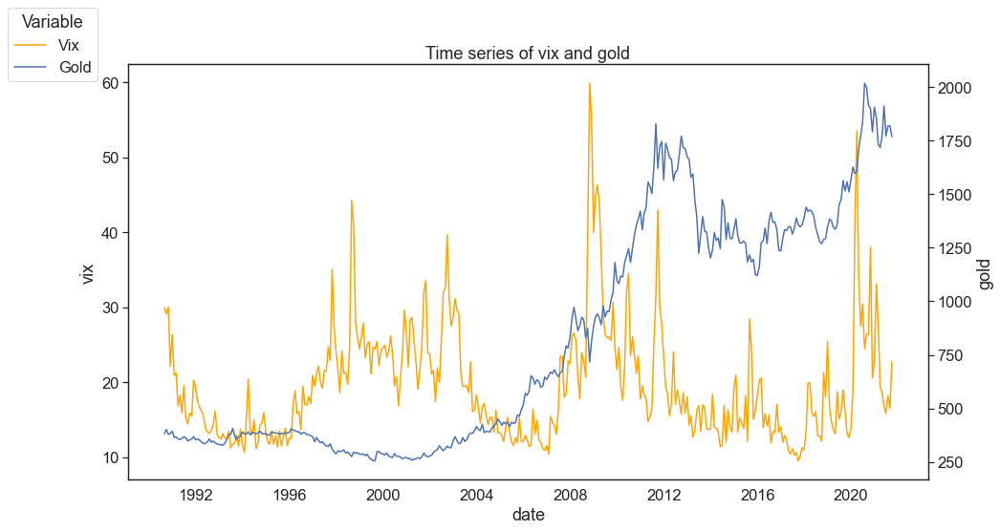

In [219]:
plt.figure(figsize = (15, 8))
ax = sns.lineplot(data=vix, x='date',y='vix', label = "Vix", color = 'orange', legend = False)
ax2 = ax.twinx()
sns.lineplot(data=gold, x='date',y='gold', label = "Gold", ax=ax2, color = 'b', legend = False)
ax.figure.legend(title = "Variable", loc = 'upper left')
ax.set_title('Time series of vix and gold')
plt.show()

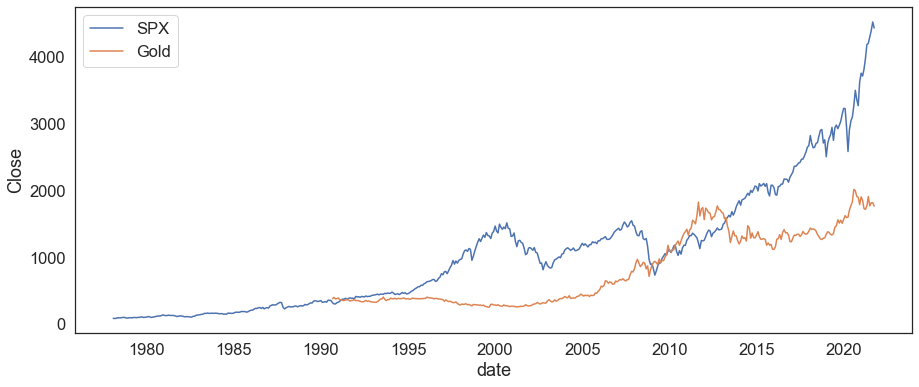

In [220]:
plt.figure(figsize = (15, 6))
spx_gold = sns.lineplot(data=spx, x='date', y= 'Close', label = 'SPX')
spx_gold = sns.lineplot(data=gold, x='date', y= 'gold', label = 'Gold')
spx_gold.legend()

In [13]:
def reject_outliers(data, m=5):
    #remove points beyond 5 s.d
    return data[abs(data - np.mean(data)) < m * np.std(data)]

year_list = ['2016','2017','2018','2019','2020','2021']
for i in year_list:
    temp_rets_df = df_combined['close'].iloc[df_combined.index.get_level_values(0).get_loc(i)].unstack().pct_change().values.flatten()
    temp_rets_df = temp_rets_df[~np.isnan(temp_rets_df)]
    temp_rets_df = reject_outliers(temp_rets_df)
    fig = px.histogram(temp_rets_df, title=f'Returns plot for year {i}')
    fig.show()

In [14]:
for i in year_list:
    temp_ebitda_df = df_combined['ebitda'].iloc[df_combined.index.get_level_values(0).get_loc(i)].unstack().pct_change().values.flatten()
    temp_ebitda_df = temp_ebitda_df[~np.isnan(temp_ebitda_df)]
    temp_ebitda_df = reject_outliers(temp_ebitda_df)
    fig = px.histogram(temp_ebitda_df, title=f'EBITDA % Change plot for year {i}')
    fig.show()

<ipython-input-13-1f47443de356>:3: RuntimeWarning:

invalid value encountered in subtract

C:\Users\Yakun\anaconda3\lib\site-packages\numpy\core\_methods.py:202: RuntimeWarning:

invalid value encountered in subtract



## 2. Hyperparameter tuning

In [15]:
def objective(trial):
    
    param_grid = {
        # "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [5]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 50, 1000, step=50),
        "max_depth": trial.suggest_int("max_depth", 3, 6),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 100, 10000, step=100),
        "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.9, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.9, step=0.1
        ),
        "random_state": trial.suggest_int("random_state", 1, 60000, step=5000),
    }

    model = lgb.LGBMClassifier( **param_grid)
    model.fit(X_train, y_train.values.ravel())
    
    if enable_val:
        preds = model.predict(X_val)   
        metric = f1_score(preds, y_val, average='macro')
    else:
        preds = model.predict(X_test)   
        metric = f1_score(preds, y_test, average='macro')

    return metric


In [16]:
study = optuna.create_study(direction="maximize", study_name="LGBM Classifier")
func = lambda trial: objective(trial)
study.optimize(func, n_trials=100)

[I 2021-11-09 19:01:26,782] A new study created in memory with name: LGBM Classifier
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=14.113635214120825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.113635214120825
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:01:31,346] Trial 0 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.2659283641442557, 'num_leaves': 800, 'max_depth': 5, 'min_data_in_leaf': 6700, 'lambda_l1': 35, 'lambda_l2': 45, 'min_gain_to_split': 14.113635214120825, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 20001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=6.522067850815341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.522067850815341
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:01:35,990] Trial 1 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.2632713907579622, 'num_leaves': 600, 'max_depth': 4, 'min_data_in_leaf': 9800, 'lambda_l1': 40, 'lambda_l2': 45, 'min_gain_to_split': 6.522067850815341, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 5001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.155835918896702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.155835918896702
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:01:40,808] Trial 2 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.12904950755557168, 'num_leaves': 450, 'max_depth': 3, 'min_data_in_leaf': 900, 'lambda_l1': 10, 'lambda_l2': 50, 'min_gain_to_split': 12.155835918896702, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9, 'random_state': 5001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.34124822301777435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34124822301777435
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:01:45,381] Trial 3 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.10729179619472098, 'num_leaves': 450, 'max_depth': 3, 'min_data_in_leaf': 2600, 'lambda_l1': 0, 'lambda_l2': 60, 'min_gain_to_split': 0.34124822301777435, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 40001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=10.82596872396876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.82596872396876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=70, reg_alpha=0.0 will be ignored. Current value: lambda_l1=70
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:01:49,954] Trial 4 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.2793339258474019, 'num_leaves': 950, 'max_depth': 4, 'min_data_in_leaf': 6100, 'lambda_l1': 70, 'lambda_l2': 45, 'min_gain_to_split': 10.82596872396876, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 45001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=11.39097878510816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.39097878510816
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:01:53,713] Trial 5 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.27651857959597437, 'num_leaves': 150, 'max_depth': 6, 'min_data_in_leaf': 6200, 'lambda_l1': 65, 'lambda_l2': 90, 'min_gain_to_split': 11.39097878510816, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 40001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7906438252755504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7906438252755504
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l1 is set=80, reg_alpha=0.0 will be ignored. Current value: lambda_l1=80
[LightGBM] [Warning] lambda_l2 is set=5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:01:57,654] Trial 6 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.214432961435689, 'num_leaves': 150, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 80, 'lambda_l2': 5, 'min_gain_to_split': 0.7906438252755504, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 5001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=5.211128273813074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.211128273813074
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:02:01,429] Trial 7 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.2547637974135775, 'num_leaves': 500, 'max_depth': 3, 'min_data_in_leaf': 4200, 'lambda_l1': 30, 'lambda_l2': 20, 'min_gain_to_split': 5.211128273813074, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5, 'random_state': 1}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=12.86629749375263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.86629749375263
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:02:05,119] Trial 8 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.10810279544408784, 'num_leaves': 400, 'max_depth': 4, 'min_data_in_leaf': 3800, 'lambda_l1': 85, 'lambda_l2': 45, 'min_gain_to_split': 12.86629749375263, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7, 'random_state': 35001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=5.21731079905993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.21731079905993
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:02:08,824] Trial 9 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.16868523463189136, 'num_leaves': 800, 'max_depth': 6, 'min_data_in_leaf': 3800, 'lambda_l1': 10, 'lambda_l2': 45, 'min_gain_to_split': 5.21731079905993, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 30001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=14.509278306005045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.509278306005045
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:02:12,724] Trial 10 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.025707612860921852, 'num_leaves': 750, 'max_depth': 5, 'min_data_in_leaf': 8600, 'lambda_l1': 100, 'lambda_l2': 80, 'min_gain_to_split': 14.509278306005045, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001, 'random_state': 20001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=8.817107706170262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.817107706170262
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:02:16,997] Trial 11 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.20744675339801538, 'num_leaves': 700, 'max_depth': 5, 'min_data_in_leaf': 9600, 'lambda_l1': 40, 'lambda_l2': 20, 'min_gain_to_split': 8.817107706170262, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 20001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=6.519236266080701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.519236266080701
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:02:21,070] Trial 12 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.29944316806995863, 'num_leaves': 1000, 'max_depth': 5, 'min_data_in_leaf': 7900, 'lambda_l1': 50, 'lambda_l2': 25, 'min_gain_to_split': 6.519236266080701, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 15001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=8.63202358061674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.63202358061674
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:02:25,918] Trial 13 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.23198153545610756, 'num_leaves': 700, 'max_depth': 4, 'min_data_in_leaf': 7200, 'lambda_l1': 30, 'lambda_l2': 70, 'min_gain_to_split': 8.63202358061674, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 55001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=3.315909436784951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.315909436784951
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:02:30,663] Trial 14 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.17826316520190505, 'num_leaves': 600, 'max_depth': 5, 'min_data_in_leaf': 9400, 'lambda_l1': 30, 'lambda_l2': 30, 'min_gain_to_split': 3.315909436784951, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 15001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=9.641737279024154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.641737279024154
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:02:35,349] Trial 15 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.2392176982468371, 'num_leaves': 300, 'max_depth': 4, 'min_data_in_leaf': 6300, 'lambda_l1': 50, 'lambda_l2': 100, 'min_gain_to_split': 9.641737279024154, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001, 'random_state': 10001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=6.851945654824133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.851945654824133
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:02:39,737] Trial 16 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.04319273875171889, 'num_leaves': 900, 'max_depth': 6, 'min_data_in_leaf': 7800, 'lambda_l1': 20, 'lambda_l2': 65, 'min_gain_to_split': 6.851945654824133, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9, 'random_state': 25001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=2.489702362558387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.489702362558387
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:02:43,996] Trial 17 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.18687965305338702, 'num_leaves': 600, 'max_depth': 5, 'min_data_in_leaf': 8900, 'lambda_l1': 25, 'lambda_l2': 30, 'min_gain_to_split': 2.489702362558387, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 15001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=14.823504695028697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.823504695028697
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:02:48,530] Trial 18 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.24020808126058435, 'num_leaves': 250, 'max_depth': 4, 'min_data_in_leaf': 5800, 'lambda_l1': 55, 'lambda_l2': 100, 'min_gain_to_split': 14.823504695028697, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7, 'random_state': 10001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=7.500836249324199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.500836249324199
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:02:52,918] Trial 19 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.010434727382004128, 'num_leaves': 900, 'max_depth': 6, 'min_data_in_leaf': 7600, 'lambda_l1': 15, 'lambda_l2': 65, 'min_gain_to_split': 7.500836249324199, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9, 'random_state': 25001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=2.2835683637328983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2835683637328983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:02:57,568] Trial 20 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.19346701693198323, 'num_leaves': 600, 'max_depth': 5, 'min_data_in_leaf': 8400, 'lambda_l1': 40, 'lambda_l2': 0, 'min_gain_to_split': 2.2835683637328983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5, 'random_state': 30001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=13.984265203329155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.984265203329155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:03:03,059] Trial 21 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.15241546277184076, 'num_leaves': 50, 'max_depth': 5, 'min_data_in_leaf': 5200, 'lambda_l1': 55, 'lambda_l2': 35, 'min_gain_to_split': 13.984265203329155, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7, 'random_state': 15001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=13.305565296728698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.305565296728698
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:03:09,256] Trial 22 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.07276715451717165, 'num_leaves': 900, 'max_depth': 6, 'min_data_in_leaf': 7000, 'lambda_l1': 15, 'lambda_l2': 80, 'min_gain_to_split': 13.305565296728698, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8, 'random_state': 25001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=3.347324922687629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.347324922687629
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:03:14,086] Trial 23 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.06178316961521446, 'num_leaves': 850, 'max_depth': 6, 'min_data_in_leaf': 7900, 'lambda_l1': 40, 'lambda_l2': 0, 'min_gain_to_split': 3.347324922687629, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5, 'random_state': 30001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=13.803015460276818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.803015460276818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] lambda_l2 is set=10, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:03:19,142] Trial 24 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.14304809934648446, 'num_leaves': 300, 'max_depth': 5, 'min_data_in_leaf': 4900, 'lambda_l1': 60, 'lambda_l2': 10, 'min_gain_to_split': 13.803015460276818, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7, 'random_state': 20001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=13.15342901179872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.15342901179872
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:03:22,709] Trial 25 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.07804136550067511, 'num_leaves': 50, 'max_depth': 6, 'min_data_in_leaf': 6900, 'lambda_l1': 75, 'lambda_l2': 35, 'min_gain_to_split': 13.15342901179872, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8, 'random_state': 25001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=10.623173617093881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.623173617093881
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:03:26,582] Trial 26 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.06451269689214129, 'num_leaves': 850, 'max_depth': 6, 'min_data_in_leaf': 6900, 'lambda_l1': 0, 'lambda_l2': 80, 'min_gain_to_split': 10.623173617093881, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5, 'random_state': 35001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=12.163194569864006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.163194569864006
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] lambda_l2 is set=10, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:03:30,404] Trial 27 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.13454250428788095, 'num_leaves': 350, 'max_depth': 5, 'min_data_in_leaf': 5200, 'lambda_l1': 65, 'lambda_l2': 10, 'min_gain_to_split': 12.163194569864006, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001, 'random_state': 35001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=13.600184889381689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.600184889381689
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:03:34,129] Trial 28 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.09410089853396052, 'num_leaves': 50, 'max_depth': 5, 'min_data_in_leaf': 2100, 'lambda_l1': 85, 'lambda_l2': 15, 'min_gain_to_split': 13.600184889381689, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8, 'random_state': 20001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=10.43000951048639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.43000951048639
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:03:37,929] Trial 29 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.0762201409094106, 'num_leaves': 800, 'max_depth': 6, 'min_data_in_leaf': 6900, 'lambda_l1': 0, 'lambda_l2': 55, 'min_gain_to_split': 10.43000951048639, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8, 'random_state': 45001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=12.038635367573919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.038635367573919
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:03:42,538] Trial 30 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.12808305758120078, 'num_leaves': 1000, 'max_depth': 5, 'min_data_in_leaf': 4900, 'lambda_l1': 65, 'lambda_l2': 75, 'min_gain_to_split': 12.038635367573919, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001, 'random_state': 35001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=12.187653448111035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.187653448111035
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:03:47,434] Trial 31 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.09975172744251452, 'num_leaves': 150, 'max_depth': 5, 'min_data_in_leaf': 2300, 'lambda_l1': 95, 'lambda_l2': 15, 'min_gain_to_split': 12.187653448111035, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 35001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=9.602812671635629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.602812671635629
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:03:53,206] Trial 32 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.09057602051678394, 'num_leaves': 700, 'max_depth': 5, 'min_data_in_leaf': 1800, 'lambda_l1': 90, 'lambda_l2': 55, 'min_gain_to_split': 9.602812671635629, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8, 'random_state': 50001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=11.80360349291238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.80360349291238
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l1 is set=80, reg_alpha=0.0 will be ignored. Current value: lambda_l1=80
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:03:59,027] Trial 33 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.12180450444464747, 'num_leaves': 1000, 'max_depth': 5, 'min_data_in_leaf': 3200, 'lambda_l1': 80, 'lambda_l2': 70, 'min_gain_to_split': 11.80360349291238, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8, 'random_state': 45001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=12.356023153960113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.356023153960113
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:04:03,886] Trial 34 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.11443302405621447, 'num_leaves': 800, 'max_depth': 4, 'min_data_in_leaf': 1300, 'lambda_l1': 95, 'lambda_l2': 55, 'min_gain_to_split': 12.356023153960113, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 40001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=1.6989038236971938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6989038236971938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:04:08,861] Trial 35 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.20071504594899472, 'num_leaves': 600, 'max_depth': 6, 'min_data_in_leaf': 8600, 'lambda_l1': 40, 'lambda_l2': 35, 'min_gain_to_split': 1.6989038236971938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9, 'random_state': 10001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=14.187904280119596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.187904280119596
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:04:13,566] Trial 36 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.1573916815859553, 'num_leaves': 500, 'max_depth': 5, 'min_data_in_leaf': 5600, 'lambda_l1': 45, 'lambda_l2': 40, 'min_gain_to_split': 14.187904280119596, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7, 'random_state': 30001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=14.891624017933811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.891624017933811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:04:18,577] Trial 37 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.2632894416398268, 'num_leaves': 650, 'max_depth': 6, 'min_data_in_leaf': 10000, 'lambda_l1': 20, 'lambda_l2': 90, 'min_gain_to_split': 14.891624017933811, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7, 'random_state': 25001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=3.795207301235626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.795207301235626
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:04:23,695] Trial 38 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.04912884976318435, 'num_leaves': 900, 'max_depth': 6, 'min_data_in_leaf': 4400, 'lambda_l1': 35, 'lambda_l2': 50, 'min_gain_to_split': 3.795207301235626, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5, 'random_state': 15001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=13.128286970671589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.128286970671589
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:04:29,105] Trial 39 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.05197920121770835, 'num_leaves': 850, 'max_depth': 6, 'min_data_in_leaf': 6400, 'lambda_l1': 55, 'lambda_l2': 0, 'min_gain_to_split': 13.128286970671589, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7, 'random_state': 1}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=4.587051864314974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.587051864314974
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] lambda_l2 is set=5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:04:34,437] Trial 40 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.1495548610417718, 'num_leaves': 950, 'max_depth': 6, 'min_data_in_leaf': 8100, 'lambda_l1': 5, 'lambda_l2': 5, 'min_gain_to_split': 4.587051864314974, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 20001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=13.516502996226874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.516502996226874
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] lambda_l2 is set=5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:04:40,055] Trial 41 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.07996267357412853, 'num_leaves': 200, 'max_depth': 6, 'min_data_in_leaf': 7300, 'lambda_l1': 75, 'lambda_l2': 5, 'min_gain_to_split': 13.516502996226874, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8, 'random_state': 25001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=11.50729983253571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.50729983253571
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] lambda_l2 is set=10, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:04:44,866] Trial 42 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.02915352930479461, 'num_leaves': 400, 'max_depth': 6, 'min_data_in_leaf': 6600, 'lambda_l1': 60, 'lambda_l2': 10, 'min_gain_to_split': 11.50729983253571, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5, 'random_state': 30001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=10.998659654790227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.998659654790227
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l1 is set=70, reg_alpha=0.0 will be ignored. Current value: lambda_l1=70
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:04:48,769] Trial 43 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.05660578444280893, 'num_leaves': 100, 'max_depth': 6, 'min_data_in_leaf': 5700, 'lambda_l1': 70, 'lambda_l2': 40, 'min_gain_to_split': 10.998659654790227, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5, 'random_state': 40001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=12.490800115716674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.490800115716674
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=70, reg_alpha=0.0 will be ignored. Current value: lambda_l1=70
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:04:52,853] Trial 44 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.14361244350938568, 'num_leaves': 300, 'max_depth': 3, 'min_data_in_leaf': 4800, 'lambda_l1': 70, 'lambda_l2': 20, 'min_gain_to_split': 12.490800115716674, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001, 'random_state': 35001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=10.703843163796822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.703843163796822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:04:57,009] Trial 45 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.16973184657027887, 'num_leaves': 400, 'max_depth': 5, 'min_data_in_leaf': 5200, 'lambda_l1': 75, 'lambda_l2': 25, 'min_gain_to_split': 10.703843163796822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001, 'random_state': 40001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=12.882287109940794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.882287109940794
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:05:01,318] Trial 46 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.10055250480059326, 'num_leaves': 50, 'max_depth': 5, 'min_data_in_leaf': 3800, 'lambda_l1': 85, 'lambda_l2': 15, 'min_gain_to_split': 12.882287109940794, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9, 'random_state': 20001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=9.957581499817946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.957581499817946
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=80, reg_alpha=0.0 will be ignored. Current value: lambda_l1=80
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:05:05,415] Trial 47 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.08533736828246258, 'num_leaves': 100, 'max_depth': 4, 'min_data_in_leaf': 3100, 'lambda_l1': 80, 'lambda_l2': 50, 'min_gain_to_split': 9.957581499817946, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 35001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=10.595358283850617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.595358283850617
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:05:09,769] Trial 48 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.06503626261967417, 'num_leaves': 750, 'max_depth': 5, 'min_data_in_leaf': 6000, 'lambda_l1': 0, 'lambda_l2': 90, 'min_gain_to_split': 10.595358283850617, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8, 'random_state': 45001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.005901388240272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.005901388240272
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:05:14,176] Trial 49 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.13578947297278107, 'num_leaves': 750, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 0, 'lambda_l2': 80, 'min_gain_to_split': 8.005901388240272, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 45001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=11.68557470590703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.68557470590703
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:05:19,199] Trial 50 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.11912622286946613, 'num_leaves': 450, 'max_depth': 4, 'min_data_in_leaf': 4400, 'lambda_l1': 60, 'lambda_l2': 60, 'min_gain_to_split': 11.68557470590703, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001, 'random_state': 55001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=12.084175654902701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.084175654902701
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:05:23,484] Trial 51 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.10189118737117901, 'num_leaves': 200, 'max_depth': 5, 'min_data_in_leaf': 2200, 'lambda_l1': 100, 'lambda_l2': 15, 'min_gain_to_split': 12.084175654902701, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 35001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=9.59610835420117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.59610835420117
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:05:28,469] Trial 52 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.08960324488870273, 'num_leaves': 700, 'max_depth': 5, 'min_data_in_leaf': 1800, 'lambda_l1': 90, 'lambda_l2': 55, 'min_gain_to_split': 9.59610835420117, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8, 'random_state': 50001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=9.01274819266959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.01274819266959
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:05:32,991] Trial 53 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.09579477462115862, 'num_leaves': 800, 'max_depth': 5, 'min_data_in_leaf': 1600, 'lambda_l1': 95, 'lambda_l2': 70, 'min_gain_to_split': 9.01274819266959, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 50001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=10.193454921256684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.193454921256684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:05:38,560] Trial 54 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.12468407695026355, 'num_leaves': 1000, 'max_depth': 5, 'min_data_in_leaf': 2900, 'lambda_l1': 90, 'lambda_l2': 70, 'min_gain_to_split': 10.193454921256684, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9, 'random_state': 50001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=11.31515032197612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.31515032197612
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=80, reg_alpha=0.0 will be ignored. Current value: lambda_l1=80
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:05:43,939] Trial 55 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.11062747038999668, 'num_leaves': 950, 'max_depth': 5, 'min_data_in_leaf': 3300, 'lambda_l1': 80, 'lambda_l2': 60, 'min_gain_to_split': 11.31515032197612, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8, 'random_state': 45001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=11.957478830986089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.957478830986089
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:05:49,462] Trial 56 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.11520662143958339, 'num_leaves': 1000, 'max_depth': 4, 'min_data_in_leaf': 1200, 'lambda_l1': 95, 'lambda_l2': 85, 'min_gain_to_split': 11.957478830986089, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 40001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.422731072519388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.422731072519388
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:05:54,735] Trial 57 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.12568549223956507, 'num_leaves': 950, 'max_depth': 4, 'min_data_in_leaf': 900, 'lambda_l1': 95, 'lambda_l2': 75, 'min_gain_to_split': 12.422731072519388, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 40001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.10977632656286218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10977632656286218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:06:00,053] Trial 58 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.20448324347642527, 'num_leaves': 550, 'max_depth': 3, 'min_data_in_leaf': 2600, 'lambda_l1': 100, 'lambda_l2': 45, 'min_gain_to_split': 0.10977632656286218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9, 'random_state': 10001}. Best is trial 0 with value: 0.36722347408641126.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.206103156703331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.206103156703331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:06:05,336] Trial 59 finished with value: 0.3678770550135086 and parameters: {'n_estimators': 5, 'learning_rate': 0.2978639186009499, 'num_leaves': 650, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 90, 'lambda_l2': 55, 'min_gain_to_split': 6.206103156703331, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 50001}. Best is trial 59 with value: 0.3678770550135086.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.8919847956536238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8919847956536238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:06:10,963] Trial 60 finished with value: 0.3683108736856408 and parameters: {'n_estimators': 5, 'learning_rate': 0.29481782648181487, 'num_leaves': 650, 'max_depth': 4, 'min_data_in_leaf': 1300, 'lambda_l1': 45, 'lambda_l2': 40, 'min_gain_to_split': 0.8919847956536238, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 50001}. Best is trial 60 with value: 0.3683108736856408.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8290288878783181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8290288878783181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:06:15,625] Trial 61 finished with value: 0.36807904107963707 and parameters: {'n_estimators': 5, 'learning_rate': 0.28962702477424235, 'num_leaves': 650, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 90, 'lambda_l2': 55, 'min_gain_to_split': 0.8290288878783181, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 50001}. Best is trial 60 with value: 0.3683108736856408.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] min_gain_to_split is set=0.1940038197368763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1940038197368763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:06:20,116] Trial 62 finished with value: 0.36729367807865493 and parameters: {'n_estimators': 5, 'learning_rate': 0.29606039965990427, 'num_leaves': 550, 'max_depth': 3, 'min_data_in_leaf': 100, 'lambda_l1': 90, 'lambda_l2': 55, 'min_gain_to_split': 0.1940038197368763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 50001}. Best is trial 60 with value: 0.3683108736856408.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] min_gain_to_split is set=0.7188700571621818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7188700571621818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:06:25,430] Trial 63 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.2891344131110164, 'num_leaves': 650, 'max_depth': 4, 'min_data_in_leaf': 100, 'lambda_l1': 95, 'lambda_l2': 65, 'min_gain_to_split': 0.7188700571621818, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 55001}. Best is trial 60 with value: 0.3683108736856408.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5408140485646276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5408140485646276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=70, reg_alpha=0.0 will be ignored. Current value: lambda_l1=70
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:06:30,382] Trial 64 finished with value: 0.36778389080209745 and parameters: {'n_estimators': 5, 'learning_rate': 0.27623459383688187, 'num_leaves': 550, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 70, 'lambda_l2': 40, 'min_gain_to_split': 1.5408140485646276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 50001}. Best is trial 60 with value: 0.3683108736856408.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.631013947875553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.631013947875553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=70, reg_alpha=0.0 will be ignored. Current value: lambda_l1=70
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:06:35,899] Trial 65 finished with value: 0.36778389080209745 and parameters: {'n_estimators': 5, 'learning_rate': 0.27562556035254815, 'num_leaves': 550, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 70, 'lambda_l2': 40, 'min_gain_to_split': 1.631013947875553, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 50001}. Best is trial 60 with value: 0.3683108736856408.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9668654587384539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9668654587384539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:06:41,287] Trial 66 finished with value: 0.3675115594956328 and parameters: {'n_estimators': 5, 'learning_rate': 0.29932582828708587, 'num_leaves': 550, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 85, 'lambda_l2': 40, 'min_gain_to_split': 0.9668654587384539, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 55001}. Best is trial 60 with value: 0.3683108736856408.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5489399183180994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5489399183180994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:06:46,795] Trial 67 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.27459973434383544, 'num_leaves': 550, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 85, 'lambda_l2': 40, 'min_gain_to_split': 1.5489399183180994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 55001}. Best is trial 60 with value: 0.3683108736856408.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3075686605574837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3075686605574837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:06:52,246] Trial 68 finished with value: 0.3688393384277572 and parameters: {'n_estimators': 5, 'learning_rate': 0.2974363909001864, 'num_leaves': 650, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 90, 'lambda_l2': 30, 'min_gain_to_split': 1.3075686605574837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 50001}. Best is trial 68 with value: 0.3688393384277572.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6543845421603485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6543845421603485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=70, reg_alpha=0.0 will be ignored. Current value: lambda_l1=70
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:06:57,183] Trial 69 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.28226848029528845, 'num_leaves': 650, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 70, 'lambda_l2': 45, 'min_gain_to_split': 1.6543845421603485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 55001}. Best is trial 68 with value: 0.3688393384277572.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.134664985382784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.134664985382784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:07:02,162] Trial 70 finished with value: 0.367752783732989 and parameters: {'n_estimators': 5, 'learning_rate': 0.24826868295531335, 'num_leaves': 500, 'max_depth': 3, 'min_data_in_leaf': 900, 'lambda_l1': 45, 'lambda_l2': 30, 'min_gain_to_split': 1.134664985382784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 50001}. Best is trial 68 with value: 0.3688393384277572.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9840794548481033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9840794548481033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:07:07,667] Trial 71 finished with value: 0.3675115594956328 and parameters: {'n_estimators': 5, 'learning_rate': 0.24977713871931545, 'num_leaves': 500, 'max_depth': 3, 'min_data_in_leaf': 1000, 'lambda_l1': 45, 'lambda_l2': 30, 'min_gain_to_split': 0.9840794548481033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 50001}. Best is trial 68 with value: 0.3688393384277572.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.3671035025702416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3671035025702416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:07:12,628] Trial 72 finished with value: 0.36778389080209745 and parameters: {'n_estimators': 5, 'learning_rate': 0.2509979882082802, 'num_leaves': 500, 'max_depth': 3, 'min_data_in_leaf': 900, 'lambda_l1': 45, 'lambda_l2': 30, 'min_gain_to_split': 2.3671035025702416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 50001}. Best is trial 68 with value: 0.3688393384277572.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=2.6209330675012477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6209330675012477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:07:17,339] Trial 73 finished with value: 0.3674960337863251 and parameters: {'n_estimators': 5, 'learning_rate': 0.22474829717190473, 'num_leaves': 450, 'max_depth': 3, 'min_data_in_leaf': 1300, 'lambda_l1': 45, 'lambda_l2': 25, 'min_gain_to_split': 2.6209330675012477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 50001}. Best is trial 68 with value: 0.3688393384277572.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.956414478050244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.956414478050244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:07:22,051] Trial 74 finished with value: 0.367807169063131 and parameters: {'n_estimators': 5, 'learning_rate': 0.2734293655247467, 'num_leaves': 650, 'max_depth': 3, 'min_data_in_leaf': 700, 'lambda_l1': 50, 'lambda_l2': 35, 'min_gain_to_split': 1.956414478050244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2, 'random_state': 50001}. Best is trial 68 with value: 0.3688393384277572.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.104918799620802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.104918799620802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:07:28,040] Trial 75 finished with value: 0.38591736475595184 and parameters: {'n_estimators': 5, 'learning_rate': 0.271532092118611, 'num_leaves': 650, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 50, 'lambda_l2': 35, 'min_gain_to_split': 2.104918799620802, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 45001}. Best is trial 75 with value: 0.38591736475595184.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=2.117658653239131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.117658653239131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:07:33,110] Trial 76 finished with value: 0.38788101549313675 and parameters: {'n_estimators': 5, 'learning_rate': 0.26720364695493537, 'num_leaves': 600, 'max_depth': 3, 'min_data_in_leaf': 1600, 'lambda_l1': 50, 'lambda_l2': 35, 'min_gain_to_split': 2.117658653239131, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 45001}. Best is trial 76 with value: 0.38788101549313675.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.921607172570531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.921607172570531
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:07:38,021] Trial 77 finished with value: 0.38509277247795815 and parameters: {'n_estimators': 5, 'learning_rate': 0.2650869502057899, 'num_leaves': 650, 'max_depth': 3, 'min_data_in_leaf': 700, 'lambda_l1': 50, 'lambda_l2': 35, 'min_gain_to_split': 2.921607172570531, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 45001}. Best is trial 76 with value: 0.38788101549313675.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=2.8569264035982864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8569264035982864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:07:41,718] Trial 78 finished with value: 0.38624530376179644 and parameters: {'n_estimators': 5, 'learning_rate': 0.26623751312430893, 'num_leaves': 650, 'max_depth': 4, 'min_data_in_leaf': 1600, 'lambda_l1': 50, 'lambda_l2': 35, 'min_gain_to_split': 2.8569264035982864, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 45001}. Best is trial 76 with value: 0.38788101549313675.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.9633104214495996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9633104214495996
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:07:45,692] Trial 79 finished with value: 0.38681866976050183 and parameters: {'n_estimators': 5, 'learning_rate': 0.26798469094328653, 'num_leaves': 600, 'max_depth': 4, 'min_data_in_leaf': 1500, 'lambda_l1': 35, 'lambda_l2': 50, 'min_gain_to_split': 2.9633104214495996, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 45001}. Best is trial 76 with value: 0.38788101549313675.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=3.1374440953887035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1374440953887035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:07:49,337] Trial 80 finished with value: 0.38624530376179644 and parameters: {'n_estimators': 5, 'learning_rate': 0.2665312915647638, 'num_leaves': 600, 'max_depth': 4, 'min_data_in_leaf': 1600, 'lambda_l1': 50, 'lambda_l2': 25, 'min_gain_to_split': 3.1374440953887035, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 45001}. Best is trial 76 with value: 0.38788101549313675.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=3.169804354724704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.169804354724704
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:07:53,024] Trial 81 finished with value: 0.39383110358141615 and parameters: {'n_estimators': 5, 'learning_rate': 0.26418909204944657, 'num_leaves': 600, 'max_depth': 4, 'min_data_in_leaf': 1500, 'lambda_l1': 50, 'lambda_l2': 35, 'min_gain_to_split': 3.169804354724704, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 45001}. Best is trial 81 with value: 0.39383110358141615.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=3.0138852418722486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0138852418722486
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:07:56,975] Trial 82 finished with value: 0.38680089569022663 and parameters: {'n_estimators': 5, 'learning_rate': 0.2605633828982116, 'num_leaves': 600, 'max_depth': 4, 'min_data_in_leaf': 1600, 'lambda_l1': 35, 'lambda_l2': 25, 'min_gain_to_split': 3.0138852418722486, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 45001}. Best is trial 81 with value: 0.39383110358141615.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=3.0551678290155677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0551678290155677
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:08:01,088] Trial 83 finished with value: 0.3921077083688007 and parameters: {'n_estimators': 5, 'learning_rate': 0.26000404500555463, 'num_leaves': 600, 'max_depth': 4, 'min_data_in_leaf': 1600, 'lambda_l1': 35, 'lambda_l2': 20, 'min_gain_to_split': 3.0551678290155677, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 45001}. Best is trial 81 with value: 0.39383110358141615.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=2.959640999393572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.959640999393572
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:08:06,037] Trial 84 finished with value: 0.38680089569022663 and parameters: {'n_estimators': 5, 'learning_rate': 0.2579242713991028, 'num_leaves': 600, 'max_depth': 4, 'min_data_in_leaf': 1600, 'lambda_l1': 35, 'lambda_l2': 25, 'min_gain_to_split': 2.959640999393572, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 45001}. Best is trial 81 with value: 0.39383110358141615.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=3.926228525915755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.926228525915755
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:08:10,411] Trial 85 finished with value: 0.3856177819288794 and parameters: {'n_estimators': 5, 'learning_rate': 0.24083152416621706, 'num_leaves': 600, 'max_depth': 4, 'min_data_in_leaf': 1600, 'lambda_l1': 35, 'lambda_l2': 20, 'min_gain_to_split': 3.926228525915755, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 45001}. Best is trial 81 with value: 0.39383110358141615.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=3.24085989655172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.24085989655172
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:08:15,012] Trial 86 finished with value: 0.36892447660224303 and parameters: {'n_estimators': 5, 'learning_rate': 0.25740420148290094, 'num_leaves': 600, 'max_depth': 4, 'min_data_in_leaf': 1900, 'lambda_l1': 35, 'lambda_l2': 25, 'min_gain_to_split': 3.24085989655172, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 40001}. Best is trial 81 with value: 0.39383110358141615.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=4.123538944305331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.123538944305331
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:08:19,579] Trial 87 finished with value: 0.36788498555083016 and parameters: {'n_estimators': 5, 'learning_rate': 0.2191867927361131, 'num_leaves': 700, 'max_depth': 4, 'min_data_in_leaf': 2600, 'lambda_l1': 25, 'lambda_l2': 25, 'min_gain_to_split': 4.123538944305331, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 45001}. Best is trial 81 with value: 0.39383110358141615.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=5.237929599576093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.237929599576093
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:08:25,323] Trial 88 finished with value: 0.3934001438424348 and parameters: {'n_estimators': 5, 'learning_rate': 0.25980700027879355, 'num_leaves': 600, 'max_depth': 4, 'min_data_in_leaf': 2000, 'lambda_l1': 30, 'lambda_l2': 20, 'min_gain_to_split': 5.237929599576093, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 45001}. Best is trial 81 with value: 0.39383110358141615.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=5.4271980631189365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4271980631189365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:08:30,452] Trial 89 finished with value: 0.393942743776956 and parameters: {'n_estimators': 5, 'learning_rate': 0.25928551911733594, 'num_leaves': 600, 'max_depth': 4, 'min_data_in_leaf': 1600, 'lambda_l1': 30, 'lambda_l2': 20, 'min_gain_to_split': 5.4271980631189365, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 45001}. Best is trial 89 with value: 0.393942743776956.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=5.183974451057993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.183974451057993
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:08:35,215] Trial 90 finished with value: 0.3938730081755767 and parameters: {'n_estimators': 5, 'learning_rate': 0.25758175457851373, 'num_leaves': 600, 'max_depth': 4, 'min_data_in_leaf': 2300, 'lambda_l1': 30, 'lambda_l2': 20, 'min_gain_to_split': 5.183974451057993, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 45001}. Best is trial 89 with value: 0.393942743776956.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=5.5534719907309675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.5534719907309675
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:08:39,535] Trial 91 finished with value: 0.39151973572709203 and parameters: {'n_estimators': 5, 'learning_rate': 0.2590055902099683, 'num_leaves': 600, 'max_depth': 4, 'min_data_in_leaf': 2400, 'lambda_l1': 30, 'lambda_l2': 20, 'min_gain_to_split': 5.5534719907309675, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 45001}. Best is trial 89 with value: 0.393942743776956.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=5.26303493850803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.26303493850803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:08:44,294] Trial 92 finished with value: 0.376931425194166 and parameters: {'n_estimators': 5, 'learning_rate': 0.25753317591773733, 'num_leaves': 600, 'max_depth': 4, 'min_data_in_leaf': 2300, 'lambda_l1': 30, 'lambda_l2': 15, 'min_gain_to_split': 5.26303493850803, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 40001}. Best is trial 89 with value: 0.393942743776956.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=4.9959842840094115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.9959842840094115
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:08:48,906] Trial 93 finished with value: 0.36790054660230004 and parameters: {'n_estimators': 5, 'learning_rate': 0.23399899037079852, 'num_leaves': 600, 'max_depth': 4, 'min_data_in_leaf': 2600, 'lambda_l1': 25, 'lambda_l2': 20, 'min_gain_to_split': 4.9959842840094115, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004, 'random_state': 40001}. Best is trial 89 with value: 0.393942743776956.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=5.835661654080563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.835661654080563
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=10, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:08:53,385] Trial 94 finished with value: 0.401002027776715 and parameters: {'n_estimators': 5, 'learning_rate': 0.24344842038887343, 'num_leaves': 700, 'max_depth': 4, 'min_data_in_leaf': 2100, 'lambda_l1': 30, 'lambda_l2': 10, 'min_gain_to_split': 5.835661654080563, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 45001}. Best is trial 94 with value: 0.401002027776715.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=5.958988718959887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.958988718959887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] lambda_l2 is set=10, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:08:57,881] Trial 95 finished with value: 0.3764181374171049 and parameters: {'n_estimators': 5, 'learning_rate': 0.24127188840662173, 'num_leaves': 700, 'max_depth': 4, 'min_data_in_leaf': 2000, 'lambda_l1': 25, 'lambda_l2': 10, 'min_gain_to_split': 5.958988718959887, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 45001}. Best is trial 94 with value: 0.401002027776715.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=5.474462891674994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.474462891674994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:09:02,718] Trial 96 finished with value: 0.4031313965213007 and parameters: {'n_estimators': 5, 'learning_rate': 0.28512138162178785, 'num_leaves': 700, 'max_depth': 4, 'min_data_in_leaf': 2400, 'lambda_l1': 30, 'lambda_l2': 20, 'min_gain_to_split': 5.474462891674994, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 45001}. Best is trial 96 with value: 0.4031313965213007.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=5.571775707737707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.571775707737707
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:09:06,881] Trial 97 finished with value: 0.3680946332481541 and parameters: {'n_estimators': 5, 'learning_rate': 0.2837856646852671, 'num_leaves': 750, 'max_depth': 4, 'min_data_in_leaf': 2400, 'lambda_l1': 30, 'lambda_l2': 20, 'min_gain_to_split': 5.571775707737707, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 40001}. Best is trial 96 with value: 0.4031313965213007.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=7.325117969243725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.325117969243725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] lambda_l2 is set=10, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:09:10,914] Trial 98 finished with value: 0.36722347408641126 and parameters: {'n_estimators': 5, 'learning_rate': 0.2452759687680824, 'num_leaves': 700, 'max_depth': 4, 'min_data_in_leaf': 2900, 'lambda_l1': 20, 'lambda_l2': 10, 'min_gain_to_split': 7.325117969243725, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 40001}. Best is trial 96 with value: 0.4031313965213007.
C:\Users\Yakun\anaconda3\lib\site-packages\optuna\distributions.py:560: UserWarning:

The distribution is specified by [1, 60000] and step=5000, but the range is not divisible by `step`. It will be replaced by [1, 55001].



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=4.446600900222624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.446600900222624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-11-09 19:09:14,580] Trial 99 finished with value: 0.3948763503911536 and parameters: {'n_estimators': 5, 'learning_rate': 0.23225178308618635, 'num_leaves': 700, 'max_depth': 4, 'min_data_in_leaf': 2100, 'lambda_l1': 30, 'lambda_l2': 20, 'min_gain_to_split': 4.446600900222624, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4, 'random_state': 45001}. Best is trial 96 with value: 0.4031313965213007.


In [17]:
best_config = dict(study.best_params.items())

print(f"\tBest value (Metric): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value (Metric): 0.40313
	Best params:
		n_estimators: 5
		learning_rate: 0.28512138162178785
		num_leaves: 700
		max_depth: 4
		min_data_in_leaf: 2400
		lambda_l1: 30
		lambda_l2: 20
		min_gain_to_split: 5.474462891674994
		bagging_fraction: 0.8
		bagging_freq: 1
		feature_fraction: 0.4
		random_state: 45001


In [18]:
%%time
clf = lgb.LGBMClassifier(**best_config)
clf.fit(X_train, y_train)
y_pred=clf.predict(X_test)

accuracy=accuracy_score(y_pred, y_test)
print('LightGBM Model accuracy score: {0:0.4f}'.format(accuracy_score(y_test, y_pred)))

C:\Users\Yakun\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=5.474462891674994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.474462891674994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
LightGBM Model accuracy score: 0.5447
Wall time: 3.57 s



True Positives(TP) =  13429

True Negatives(TN) =  391

False Positives(FP) =  341

False Negatives(FN) =  11210
#####################################
              precision    recall  f1-score   support

         0.0       0.55      0.98      0.70     13770
         1.0       0.53      0.03      0.06     11601

    accuracy                           0.54     25371
   macro avg       0.54      0.50      0.38     25371
weighted avg       0.54      0.54      0.41     25371



<AxesSubplot:>

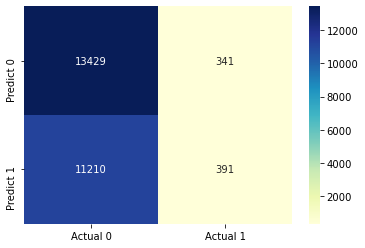

In [19]:
cm = confusion_matrix(y_test, y_pred)
print('\nTrue Positives(TP) = ', cm[0,0])
print('\nTrue Negatives(TN) = ', cm[1,1])
print('\nFalse Positives(FP) = ', cm[0,1])
print('\nFalse Negatives(FN) = ', cm[1,0])
print('#####################################')
print(classification_report(y_test, y_pred))

cm_matrix = pd.DataFrame(data=cm, columns=['Actual 0', 'Actual 1'], 
                                 index=['Predict 0', 'Predict 1'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Benchmark DataFrame

In [20]:
X_backtest = df_combined.copy()
X_backtest = X_backtest.drop('close', axis=1)
if enable_val:
    X_backtest = X_backtest.loc[y_date_index_list[val_split]:]
else:
    X_backtest = X_backtest.loc[y_date_index_list[train_split]:]
X_backtest

accoci  assets  assetsavg  assetsc  assetsnc  \
date       ticker                                                 
2016-08-31 A          NaN     NaN        NaN      NaN       NaN   
           AAL        NaN     NaN        NaN      NaN       NaN   
           AAP        NaN     NaN        NaN      NaN       NaN   
           AAPL       NaN     NaN        NaN      NaN       NaN   
           ABBV       NaN     NaN        NaN      NaN       NaN   
...                   ...     ...        ...      ...       ...   
2021-09-30 YUM        NaN     NaN        NaN      NaN       NaN   
           ZBH        NaN     NaN        NaN      NaN       NaN   
           ZBRA       NaN     NaN        NaN      NaN       NaN   
           ZION       NaN     NaN        NaN      NaN       NaN   
           ZTS        NaN     NaN        NaN      NaN       NaN   

                   assetturnover  bvps  capex  cashneq  cashnequsd  ...  \
date       ticker                                                   ...   
2016-08-31 A                 NaN   NaN    NaN      NaN         NaN  ...   
           AAL               NaN   NaN    NaN      NaN         NaN  ...   
           AAP               NaN   NaN    NaN      NaN         NaN  ...   
           AAPL              NaN   NaN    NaN      NaN         NaN  ...   
           ABBV              NaN   NaN    NaN      NaN         NaN  ...   
...                          ...   ...    ...      ...         ...  ...   
2021-09-30 YUM               NaN   NaN    NaN      NaN         NaN  ...   
           ZBH               NaN   NaN    NaN      NaN         NaN  ...   
           ZBRA              NaN   NaN    NaN      NaN         NaN  ...   
           ZION              NaN   NaN    NaN      NaN         NaN  ...   
           ZTS               NaN   NaN    NaN      NaN         NaN  ...   

                   rolling_ros_3M  rolling_ros_6M  rolling_ros_9M  \
date       ticker                                                   
2016-08-31 A             0.006849        0.042553        0.166667   
           AAL          -0.021429        0.022388       -0.021429   
           AAP          -0.023256        0.000000       -0.034483   
           AAPL         -0.026667       -0.055016       -0.058065   
           ABBV          0.021407        0.040498        0.704082   
...                           ...             ...             ...   
2021-09-30 YUM           0.000000        0.021739        0.187726   
           ZBH           0.000000        0.440860      -15.888889   
           ZBRA          0.000000        0.068323        0.202797   
           ZION          0.000000        0.191601        0.604240   
           ZTS           0.000000        0.005780        0.041916   

                   rolling_ros_12M  rolling_sbcomp_1M  rolling_sbcomp_2M  \
date       ticker                                                          
2016-08-31 A              0.441176                0.0                0.0   
           AAL            0.141667                0.0                0.0   
           AAP                 NaN                0.0                0.0   
           AAPL          -0.048860                0.0                0.0   
           ABBV           1.141026                0.0                0.0   
...                            ...                ...                ...   
2021-09-30 YUM            0.146341                0.0                0.0   
           ZBH           32.500000                0.0                0.0   
           ZBRA           0.246377                0.0                0.0   
           ZION           0.907563                0.0                0.0   
           ZTS            0.014577                0.0                0.0   

                   rolling_sbcomp_3M  rolling_sbcomp_6M  rolling_sbcomp_9M  \
date       ticker                                                            
2016-08-31 A               -0.807018          -0.476190          -0.796296   
           AAL                   inf           0.0

In [21]:
S = sec_master_raw.index.tolist()
probs = clf.predict_proba(X_backtest) #gives the probability of the target (compare to pred)
proba_df = pd.DataFrame(probs, columns=['0','1'], index=X_backtest.index)
proba_df = proba_df.drop('0', axis=1)
proba_df.rename(columns={'1':'probs'},inplace=True)

In [22]:
benchmark_weights = pd.DataFrame(index=X_backtest.index)
weights_temp = df_combined['marketcap'].unstack().ffill()
weights_temp = weights_temp.divide(weights_temp.sum(1),0).stack().to_frame('benchmark_weights')
benchmark_weights = benchmark_weights.join(weights_temp, how='left')

forward_1m_change = df_combined['close'].unstack().pct_change(1).shift(-1)
benchmark_df = pd.DataFrame(index=df_combined.index)
benchmark_df = benchmark_df.join(forward_1m_change.stack().to_frame('forward_rets'), how='left')
benchmark_df = benchmark_df.loc[:benchmark_df.index.get_level_values(0).unique()[-2]]

## 3. Portfolio Optimisation

In [23]:
temp_dict = df_combined['sector'].unstack().ffill().iloc[-1,:].reset_index()
temp_dict.columns = ['ticker','sector']
sector_dict = temp_dict.groupby('sector')['ticker'].apply(list).to_dict()
sector_list = list(sector_dict.keys())
sector_list

['Basic Materials',
 'Communication Services',
 'Consumer Cyclical',
 'Consumer Defensive',
 'Energy',
 'Financial Services',
 'Healthcare',
 'Industrials',
 'Real Estate',
 'Technology',
 'Utilities']

In [24]:
def optimisation_model(S,
                       K,
                       sector_dict,
                       proba_df,
                       benchmark_weights,
                       current_weights,                     
                       L_security,
                       L_sector,
                       ):
    
    M = ConcreteModel()
    M.w = Var(S, within=NonNegativeReals, bounds=(0,1), initialize=0)    
    M.Objective = Objective(
        expr=sum(proba_df[s]*M.w[s] for s in S),
        sense=maximize
    )
        
    @M.Constraint()
    def portfolio_sum_to_one(M):
        return(sum(M.w[s] for s in S)==1)
    
    @M.Constraint(S)
    def proper_weights(M, s):
        return(0, M.w[s], 1)

    @M.Constraint(S)
    def active_security_bet(M, s):
        return(-L_security, M.w[s] - benchmark_weights.to_dict()[s], L_security)
    
    @M.Constraint(K)
    def active_sector_constraint(M,k):       
        sector_weight = 0
        portfolio_sector_weight = 0
        for stock in sector_dict[k]:
            try:
                sector_weight += benchmark_weight_ref.loc[stock]
                portfolio_sector_weight += current_weights_ref.loc[stock]
            except:
                continue
        return (-L_sector, portfolio_sector_weight - sector_weight, L_sector)
    
    return M

# VIX Regime

In [25]:
vix_regime = vix_raw.reindex(index=vix_raw.index[::-1])
vix_train = vix_regime[:proba_df.index.get_level_values(0)[0]][['Price']]
vix_test = vix_regime[proba_df.index.get_level_values(0)[0]:][['Price']]

model = mix.GaussianMixture(n_components=3, 
                            covariance_type="full", 
                            n_init=100, 
                            random_state=7).fit(vix_train)

# Predict the optimal sequence of internal hidden state
hidden_states = model.predict(vix_test)

print("Means and vars of each hidden state")
for i in range(model.n_components):
    print("{0}th hidden state".format(i))
    print("mean = ", model.means_[i])
    print("var = ", np.diag(model.covariances_[i]))
    print()

Means and vars of each hidden state
0th hidden state
mean =  [14.50187177]
var =  [5.87045757]

1th hidden state
mean =  [22.74712863]
var =  [20.92253352]

2th hidden state
mean =  [36.68200978]
var =  [147.0157853]



Text(0.5, 0.98, 'Historical VIX Regimes')

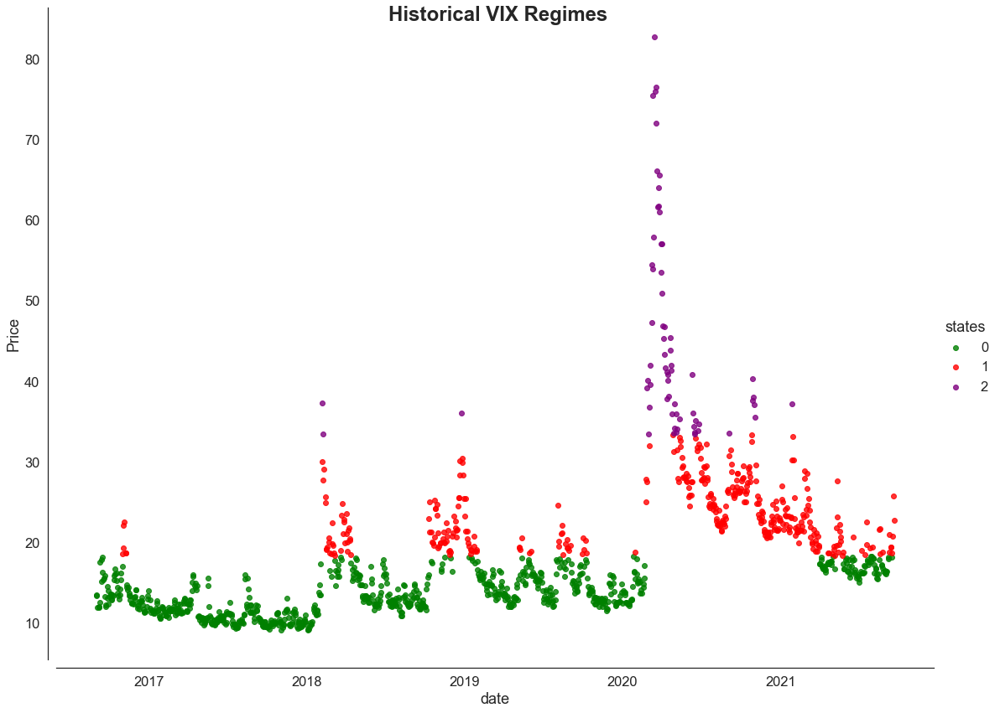

In [26]:
sns.set(font_scale=1.5)
states = (pd.DataFrame(hidden_states, columns=['states'], index=vix_test.index)
          .join(vix_test, how='inner')
          .reset_index(drop=False)
          .rename(columns={'index':'Date'}))
states.head()

#suppressing warnings because of some issues with the font package
#in general, would not rec turning off warnings.
import warnings
warnings.filterwarnings("ignore")
style_kwds = {'xtick.major.size': 3, 'ytick.major.size': 3, 'legend.frameon': True}
sns.set_style('white', style_kwds)
order = [0, 1, 2]
colors = ["green","red","purple"]
fg = sns.FacetGrid(data=states, hue='states', hue_order=order,
                   palette=colors, aspect=1.31, height=12)
fg.map(plt.scatter, 'date', "Price", alpha=0.8).add_legend()
sns.despine(offset=10)
fg.fig.suptitle('Historical VIX Regimes', fontsize=24, fontweight='demi')

In [27]:
states_ref = states.set_index('date')
states_to_limit_ref = {
    0:1,
    1:0.5,
    2:0.5
}
states_ref['multiplier'] = states_ref['states'].map(states_to_limit_ref)
states_ref

,states,Price,multiplier
date,,,
2016-08-31,0,13.42,1.0
2016-09-01,0,13.48,1.0
2016-09-02,0,11.98,1.0
2016-09-06,0,12.02,1.0
2016-09-07,0,11.94,1.0
...,...,...,...
2021-09-15,0,18.18,1.0
2021-09-16,1,18.69,0.5
2021-09-17,1,20.81,0.5


In [28]:
L_security = 0.02
L_sector = 0.2

T_list = proba_df.index.get_level_values(0).unique().tolist()
df_limits_ref = pd.DataFrame(index=T_list)
df_portfolio_weights_before_rebalancing = pd.DataFrame().reindex_like(proba_df).fillna(0)
df_portfolio_weights_after_rebalancing = pd.DataFrame().reindex_like(proba_df).fillna(0)

df_limits_ref['L_security'] = L_security
df_portfolio_weights_before_rebalancing['weights'] = 0
df_portfolio_weights_after_rebalancing['weights'] = 0
  
df_limits_ref = df_limits_ref.join(states_ref['multiplier']).ffill().bfill()
df_limits_ref['L_security'] *= df_limits_ref['multiplier']
df_limits_ref = df_limits_ref.drop('multiplier', axis=1)
df_limits_ref

,L_security
2016-08-31,0.02
2016-09-30,0.02
2016-10-31,0.02
2016-11-30,0.02
2016-12-31,0.02
...,...
2021-05-31,0.01
2021-06-30,0.02
2021-07-31,0.02
2021-08-31,0.02


In [29]:
%%time

import pyomo.environ as pyo
from pyomo.opt import SolverFactory

solvername='ipopt'
solverpath_exe='C:\\Users\\Yakun\\anaconda3\\pkgs\\ipopt-3.11.1-2\\Library\\bin\\ipopt.exe' #does not need to be directly on c drive
opt = SolverFactory(solvername,executable=solverpath_exe)

df_portfolio_weights_before_rebalancing = df_portfolio_weights_before_rebalancing.drop('probs', axis=1)
df_portfolio_weights_after_rebalancing = df_portfolio_weights_after_rebalancing.drop('probs', axis=1)
df_portfolio_weights_before_rebalancing = df_portfolio_weights_before_rebalancing.unstack().shift(1).iloc[1:].stack()

print('Simulating for ', end='')
init=True
for t, t_next in windowed(T_list,2):
    state = True
    while state:
        print(f'{t}, ', end='')
        benchmark_weight_ref = benchmark_weights.loc[t, 'benchmark_weights']
        proba_ref = proba_df.loc[t, 'probs'].fillna(-1).to_dict()
        S_ref = proba_df[proba_df>0].loc[t].index.to_list()
        
        if init:
            current_weight_ref = df_portfolio_weights_after_rebalancing.loc[t,'weights']
        else:
            current_weight_ref = df_portfolio_weights_before_rebalancing.loc[t,'weights']
            
        for key in benchmark_weight_ref.keys():
            if key not in current_weight_ref.keys():
                current_weight_ref[key] = 0
                
        L_security_ref = df_limits_ref.loc[t,'L_security']
        
        M = optimisation_model(S_ref,
                       sector_list,
                       sector_dict,
                       proba_ref,
                       benchmark_weight_ref,
                       current_weight_ref,
                       L_security_ref,
                       L_sector
                       )
        opt_results = opt.solve(M, tee=False)

        if (opt_results.solver.status == SolverStatus.ok) and (opt_results.solver.termination_condition == TerminationCondition.optimal):
            pass
        else:
            current_L_security = df_limits_ref.loc[t, 'L_security']
            df_limits_ref.loc[t, 'L_security'] += 0.05
            print(f'WARNING: Unable to find solution with L_security of {current_L_security}')
            continue
        
        df_weight_output_at_t = pd.DataFrame.from_dict(M.w.extract_values(), orient='index', columns=[str(M.w)])  
        
        if np.allclose(df_weight_output_at_t.min(axis=1), 0.0):
            df_weight_output_at_t[df_weight_output_at_t<0] = 0
        
        df_portfolio_weights_after_rebalancing.loc[t, :] = np.round(df_weight_output_at_t['w'].values,4)
        
        if t_next is not None:
            drifted_weights = (benchmark_df.loc[t]+1).mul(df_weight_output_at_t['w'],axis=0)
            drifted_weights = drifted_weights/ drifted_weights.sum()
            df_portfolio_weights_before_rebalancing.loc[t_next, :] = np.round(drifted_weights['forward_rets'].values,4)
        state = False
        init=False
print('Simulation complete')

Simulating for 2016-08-31 00:00:00, 2016-09-30 00:00:00, 2016-10-31 00:00:00, 2016-11-30 00:00:00, 2016-12-31 00:00:00, 2017-01-31 00:00:00, 2017-02-28 00:00:00, 2017-03-31 00:00:00, 2017-04-30 00:00:00, 2017-05-31 00:00:00, 2017-06-30 00:00:00, 2017-07-31 00:00:00, 2017-08-31 00:00:00, 2017-09-30 00:00:00, 2017-10-31 00:00:00, 2017-11-30 00:00:00, 2017-12-31 00:00:00, 2018-01-31 00:00:00, 2018-02-28 00:00:00, 2018-03-31 00:00:00, 2018-04-30 00:00:00, 2018-05-31 00:00:00, 2018-06-30 00:00:00, 2018-07-31 00:00:00, 2018-08-31 00:00:00, 2018-09-30 00:00:00, 2018-10-31 00:00:00, 2018-11-30 00:00:00, 2018-12-31 00:00:00, 2019-01-31 00:00:00, 2019-02-28 00:00:00, 2019-03-31 00:00:00, 2019-04-30 00:00:00, 2019-05-31 00:00:00, 2019-06-30 00:00:00, 2019-07-31 00:00:00, 2019-08-31 00:00:00, 2019-09-30 00:00:00, 2019-10-31 00:00:00, 2019-11-30 00:00:00, 2019-12-31 00:00:00, 2020-01-31 00:00:00, 2020-02-29 00:00:00, 2020-03-31 00:00:00, 2020-04-30 00:00:00, 2020-05-31 00:00:00, 2020-06-30 00:00:00

## 4. Backtest

In [30]:
portfolio = df_portfolio_weights_after_rebalancing.copy()
portfolio = portfolio.join(benchmark_df, how='left')
wealth = (portfolio['weights']*portfolio['forward_rets'].values).groupby(level=0).sum()
wealth = wealth.shift(1) #becomes the actual return (not the fwd return)
start_date = wealth.index[0]
wealth.loc[start_date] = 0

compare_df = pd.DataFrame(index=wealth.index)
compare_df['portfolio'] = (wealth+1).cumprod()
benchmark_wealth = (spx['Close'].pct_change().loc[wealth.index])
benchmark_wealth.loc[start_date] = 0
compare_df['benchmark'] = (benchmark_wealth+1).cumprod()

tracking_error = np.sqrt(sum([val**2 for val in wealth - benchmark_wealth])) * 100
sharpe_ratio = wealth.mean()/wealth.std() * np.sqrt(252/12)
duration = compare_df['portfolio'].shape[0]/12
annual_returns = ((compare_df['portfolio'].iloc[-1])**(1/duration)-1)*100
ir = (annual_returns - ((compare_df['benchmark'].iloc[-1])**(1/duration)-1)*100)/tracking_error


final_X_test_date = X_test.index.get_level_values(0).unique()[-1]
fig = px.line(compare_df, title=f"{duration:.2f} years backtest - Cum VA(Ann.Rtn={annual_returns:.2f}%, Sharpe={sharpe_ratio:.2f}, IR={ir:.2f}), TE={tracking_error:.2f}%")
fig.show()

In [31]:
#Number of stocks inv
px.line(df_portfolio_weights_after_rebalancing[df_portfolio_weights_after_rebalancing>0].dropna().groupby(level=0).count(), title="Number of stocks in Portfolio").show()

# Transfer Coefficient

In [32]:
mcap = df_combined['marketcap'].unstack().ffill()
mcap = mcap.divide(mcap.sum(1),0)
mcap_df = pd.DataFrame(index=df_combined.index)
mcap_df = mcap_df.join(mcap.stack().to_frame('benchmark_weights'), how='left')
mcap_df = mcap_df.loc[:mcap_df.index.get_level_values(0).unique()[-2]]
mcap_df

benchmark_weights
date       ticker                   
1999-12-31 AAMRQ            0.000420
           AAPL             0.001462
           ABI1             0.001522
           ABS              0.001154
           ABT              0.005018
...                              ...
2021-08-31 YUM              0.000891
           ZBH              0.000756
           ZBRA             0.000651
           ZION             0.000191
           ZTS              0.001995

[132185 rows x 1 columns]

In [33]:
tc_df = df_portfolio_weights_after_rebalancing.copy()
tc_df = tc_df.join(benchmark_df, how='left')
tc_df = tc_df.join(mcap_df, how='left').dropna()
tc_df['active_weights'] = (tc_df['weights'] - tc_df['benchmark_weights'])
tc_df['active_returns'] = tc_df['active_weights'] * tc_df['forward_rets']
tc_df

weights  forward_rets  benchmark_weights  active_weights  \
date       ticker                                                             
2016-08-31 A        0.0000      0.002341           0.000666       -0.000666   
           AAL      0.0000      0.008540           0.000819       -0.000819   
           AAP      0.0000     -0.052484           0.000502       -0.000502   
           AAPL     0.0436      0.065485           0.023594        0.020006   
           ABBV     0.0000     -0.016069           0.004259       -0.004259   
...                    ...           ...                ...             ...   
2021-08-31 YUM      0.0209     -0.015111           0.000891        0.020009   
           ZBH      0.0000     -0.062812           0.000756       -0.000756   
           ZBRA     0.0000     -0.012381           0.000651       -0.000651   
           ZION     0.0000      0.007081           0.000191       -0.000191   
           ZTS      0.0000      0.002151           0.001995       -0.001995   

                   active_returns  
date       ticker                  
2016-08-31 A            -0.000002  
           AAL          -0.000007  
           AAP           0.000026  
           AAPL          0.001310  
           ABBV          0.000068  
...                           ...  
2021-08-31 YUM          -0.000302  
           ZBH           0.000047  
           ZBRA          0.000008  
           ZION         -0.000001  
           ZTS          -0.000004  

[30511 rows x 5 columns]

In [34]:
for i in year_list:
    temp_tc_df = tc_df.iloc[tc_df.index.get_level_values(0).get_loc(i)]
    fig = px.scatter(temp_tc_df, x="active_weights", y="forward_rets", title=f'Transfer Coefficient Plot for year:{i}')
    fig.add_hline(y=0, line_dash="dot")
    fig.add_vline(x=0, line_dash="dot")
    fig.show()

## SHAP

In [ ]:
explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(X)

In [ ]:
shap.summary_plot(shap_values, X)

In [ ]:
lgb.create_tree_digraph(clf, tree_index=0, orientation='vertical')

In [ ]:
lgb.create_tree_digraph(clf, tree_index=1, orientation='vertical')

In [ ]:
lgb.create_tree_digraph(clf, tree_index=2, orientation='vertical')

In [ ]:
lgb.create_tree_digraph(clf, tree_index=3, orientation='vertical')

In [ ]:
lgb.create_tree_digraph(clf, tree_index=4, orientation='vertical')

In [ ]:
clf

# Stress Test

In [38]:
def gbm(n_years=10, n_scenarios=1000, mu=0.07, sigma=0.15, steps_per_year=12, s_0=1000.0):
    """
    Evolution of a stock price using a Geometric Browninan Motion Model
    """
    
    dt = 1/steps_per_year
    n_steps = int(n_years*steps_per_year)
    rets_plus_one = np.random.normal(loc=1+mu*dt, scale=sigma*np.sqrt(dt),size=(n_steps,n_scenarios))  
    rets_plus_one[0] = 1
    prices = s_0*pd.DataFrame(rets_plus_one).cumprod()
    return prices

mu = annual_returns/100
sigma = wealth.std() * np.sqrt(252/12)

p = gbm(n_years=10, n_scenarios=1000, mu=mu, sigma=sigma)
p

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
1,1175.989282,1031.796345,1113.774600,962.009658,1084.751858,1001.005000,1153.735825,1027.616132,1017.653368,918.940136,...,1008.087255,955.774611,1053.695359,994.442743,1020.556468,1043.666711,1041.604572,1097.257466,1146.235601,942.174856
2,1295.252922,1016.779866,1117.496070,921.975118,1256.261207,926.858076,1258.215291,1009.576356,1146.092059,888.645468,...,1011.031986,885.491587,1066.544060,1088.582091,1001.118995,992.965183,998.242408,1092.016459,1086.424248,973.394422
3,1490.728164,1163.980593,1102.754426,1042.915952,1181.759773,910.651403,1499.966858,960.019507,1137.629337,818.211320,...,982.843159,962.087368,997.714446,1252.678062,978.617189,1125.677806,939.910282,972.378334,1174.227286,1018.983912
4,1484.095310,1169.672219,1137.400577,953.344661,1221.644919,796.021796,1667.874001,906.362327,1066.431980,929.244315,...,1081.056717,1035.890218,1015.070480,1157.063309,1006.311659,1173.652827,957.777787,938.877744,1150.688334,1114.236394
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,4135.974687,2865.110238,1892.901028,6143.891505,12151.963028,2440.266314,9968.041593,5993.206270,6245.843418,6519.881806,...,5982.065669,13000.407801,3322.153527,7877.716677,1145.558653,2878.798879,5917.940596,6232.293573,3334.332782,5830.273235
116,3890.485381,2925.402180,2023.904788,5827.040772,13201.160413,2488.333465,9926.048724,7066.503737,6393.675505,7017.045747,...,5981.927825,13375.589044,3093.868524,9066.265049,1102.819985,3102.042460,6222.932179,6780.043613,2958.453571,5859.664899
117,4034.612791,3032.118693,2010.241180,5874.636523,16082.196896,2434.327752,10146.499906,7694.580440,6301.618343,7332.390158,...,5825.241654,12593.728433,3051.700579,9071.555613,1028.959516,3111.387473,6255.953436,6477.204952,2848.148248,6120.918486
118,4280.237180,3074.642456,2001.260429,6088.993931,13404.162512,2486.386622,10498.072327,8176.810992,7405.869557,7390.131451,...,6788.366058,11733.174621,3003.971565,9425.239674,1146.117528,3132.236679,5939.762977,6369.713663,2746.288047,6730.292688


In [39]:
mc_sim = ((p.iloc[-1,:]-p.iloc[0,:])/p.iloc[0,:]-1)
fig = px.histogram(mc_sim, title="n=1000, 10-year simulation teminal values with initial capital of $1000")
fig.add_vline(x=0,line_width=2, line_dash="dash", line_color="red")
fig.show()

In [40]:
fig = px.line(p,title="n=1000, 10 year simulation wealth plots")
fig.add_hline(y=1000,line_width=2, line_dash="dash", line_color="red")
fig.show()

## 5. Return Attribution

In [41]:
## Factor grouping 


# Macro factors 
macro_market_risk = [
            "fxusd",
            "YC/USA3M - Rate",
            "YC/USA2Y - Rate",
            "YC/USA5Y - Rate",
            "YC/USA10Y - Rate",
            "rolling_YC/USA3M - Rate_1M",
            "rolling_YC/USA3M - Rate_2M",
            "rolling_YC/USA3M - Rate_3M",
            "rolling_YC/USA3M - Rate_6M",
            "rolling_YC/USA3M - Rate_9M",
            "rolling_YC/USA3M - Rate_12M",
            "rolling_YC/USA2Y - Rate_1M",
            "rolling_YC/USA2Y - Rate_2M",
            "rolling_YC/USA2Y - Rate_3M",
            "rolling_YC/USA2Y - Rate_6M",
            "rolling_YC/USA2Y - Rate_9M",
            "rolling_YC/USA2Y - Rate_12M",
            "rolling_YC/USA5Y - Rate_1M",
            "rolling_YC/USA5Y - Rate_2M",
            "rolling_YC/USA5Y - Rate_3M",
            "rolling_YC/USA5Y - Rate_6M",
            "rolling_YC/USA5Y - Rate_9M",
            "rolling_YC/USA5Y - Rate_12M",
            "rolling_YC/USA10Y - Rate_1M",
            "rolling_YC/USA10Y - Rate_2M",
            "rolling_YC/USA10Y - Rate_3M",
            "rolling_YC/USA10Y - Rate_6M",
            "rolling_YC/USA10Y - Rate_9M",
            "rolling_YC/USA10Y - Rate_12M",
              "gold",
              "rolling_gold_1M",
              "rolling_gold_2M",
              "rolling_gold_3M",
              "rolling_gold_6M",
              "rolling_gold_9M",
              "rolling_gold_12M",
]

macro_volatility = [
            "vix",
            "rolling_vix_1M",
            "rolling_vix_2M",
            "rolling_vix_3M",
            "rolling_vix_6M",
            "rolling_vix_9M",
            "rolling_vix_12M",
            ]

# Micro factors 
micro_earnings = [
            "roa",
            "roe",
            "roic",
            "ros",
            "netmargin",
            "ebitdamargin",
            "eps",
            "assetturnover",
            "rolling_roa_1M",
            "rolling_roa_2M",
            "rolling_roa_3M",
            "rolling_roa_6M",
            "rolling_roa_9M",
            "rolling_roa_12M",
            "rolling_roe_1M",
            "rolling_roe_2M",
            "rolling_roe_3M",
            "rolling_roe_6M",
            "rolling_roe_9M",
            "rolling_roe_12M",
            "rolling_roic_1M",
            "rolling_roic_2M",
            "rolling_roic_3M",
            "rolling_roic_6M",
            "rolling_roic_9M",
            "rolling_roic_12M",
            "rolling_ros_1M",
            "rolling_ros_2M",
            "rolling_ros_3M",
            "rolling_ros_6M",
            "rolling_ros_9M",
            "rolling_ros_12M",

            "rolling_netmargin_1M",
            "rolling_netmargin_2M",
            "rolling_netmargin_3M",
            "rolling_netmargin_6M",
            "rolling_netmargin_9M",
            "rolling_netmargin_12M",

            "rolling_ebitdamargin_1M",
            "rolling_ebitdamargin_2M",
            "rolling_ebitdamargin_3M",
            "rolling_ebitdamargin_6M",
            "rolling_ebitdamargin_9M",
            "rolling_ebitdamargin_12M",

            "rolling_eps_1M",
            "rolling_eps_2M",
            "rolling_eps_3M",
            "rolling_eps_6M",
            "rolling_eps_9M",
            "rolling_eps_12M",
            ]

micro_financial_risk = [
            "currentratio",
            "de",
            ]

micro_size = [
            "assets",
            "assetsavg",
            "marketcap",
            "rolling_revenue_1M",
            "rolling_revenue_2M",
            "rolling_revenue_3M",
            "rolling_revenue_6M",
            "rolling_revenue_9M",
            "rolling_revenue_12M",
            "rolling_revenueusd_1M",
            "rolling_revenueusd_2M",
            "rolling_revenueusd_3M",
            "rolling_revenueusd_6M",
            "rolling_revenueusd_9M",
            "rolling_revenueusd_12M",
            ]


micro_valuation = [
            "pb",
            "pe",
            "pe1",
            "bvps",
            "evebit",
            "evebitda",
            "rolling_pb_1M",
            "rolling_pb_2M",
            "rolling_pb_3M",
            "rolling_pb_6M",
            "rolling_pb_9M",
            "rolling_pb_12M",
            "rolling_pe_1M",
            "rolling_pe_2M",
            "rolling_pe_3M",
            "rolling_pe_6M",
            "rolling_pe_9M",
            "rolling_pe_12M",
            ]


In [237]:
# Map category name with the corresponding tickers 
features_map = {
    "macro_market_risk": macro_market_risk,
    "macro_volatility": macro_volatility,
    "micro_earnings": micro_earnings,
    "micro_financial_risk": micro_financial_risk,
    "micro_size": micro_size,
    "micro_valuation": micro_valuation,
}

In [206]:
# Portfolio return dataframe 
port_ret = portfolio['weights']*portfolio['forward_rets'].values
port_ret = port_ret*100
port_ret = port_ret.to_frame().rename({"weights": "ret_port%"}, axis=1)

# Benchmark return dataframe
start_date = port_ret.index[0]
bm_price_raw = y_raw.copy()
# bm_price_raw = df_combined["close"].unstack()

bm_ret_raw = bm_price_raw.pct_change()
bm_ret_raw = bm_ret_raw.stack()
bm_ret_raw = bm_ret_raw.to_frame("ret%")
bm_ret_raw = bm_ret_raw.loc[start_date[0]:,]
bm_ret = bm_ret_raw["ret%"] * benchmark_weights["benchmark_weights"]
bm_ret = bm_ret.to_frame("ret_spx%")
bm_ret

# Active return dataframe 
active_ret = port_ret["ret_port%"] - bm_ret["ret_spx%"]
active_ret = active_ret.to_frame("ret_active%")

# features_df = X.copy()
features_df = df_combined.copy()
features_df = features_df[start_date:]

In [207]:
# Function to normlize features' values across different assets (correct to deal with na values)
def normalize(df, feature):
    df_norm = df[feature].unstack().subtract(df[feature].unstack().mean(axis=1), axis=0) \
                                                      .div(df[feature].unstack().std(axis=1), axis=0)
    df[feature] = df_norm.stack()

In [238]:
# Normalize and group features 
features_useful = pd.DataFrame(index=features_df.index)
features_useful_compiled = pd.DataFrame(index=features_df.index)

for feature_cat in features_map:
    feature_constitutes = features_map[feature_cat]
    
    for feature in feature_constitutes:
            normalize(features_df,feature)
            features_useful[feature] = features_df[feature]
    
    features_useful_compiled[feature_cat] = features_useful[feature_constitutes].mean(axis=1)

In [241]:
features_useful[features_useful["pb"].isna()==False]

pb        pe       pe1      bvps    evebit  evebitda  \
date       ticker                                                               
2016-09-30 A       0.002214  0.164584  0.193553 -0.400379  0.079863  0.024674   
           AAL     0.045298 -0.231968 -0.245990 -0.550402 -0.042676 -0.057067   
           AAP     0.038164  0.108842  0.129138  0.417021  0.036099 -0.005271   
           AAPL    0.057903 -0.087908 -0.088858 -0.627332 -0.016418 -0.030752   
           ABBV    0.499528 -0.035320 -0.032103 -0.687513  0.018593  0.005146   
...                     ...       ...       ...       ...       ...       ...   
2021-06-30 ZBRA    0.073430  0.044381  0.031591  0.189580  0.151769  0.374064   
           ZION   -0.117271 -0.311962 -0.342662  0.206644 -0.334205 -0.770045   
           ZTS     0.246656  0.143766  0.137952 -0.494727  0.180356  0.463352   
2021-09-30 AVGO    0.707107  0.707107  0.707107  0.707107  0.707107  0.707107   
           ORCL   -0.707107 -0.707107 -0.707107 -0.707107 -0.707107 -0.707107   

                   rolling_pb_1M  rolling_pb_2M  rolling_pb_3M  rolling_pb_6M  \
date       ticker                                                               
2016-09-30 A           -0.220894      -0.220894      -0.220894       0.123776   
           AAL          0.069702       0.069702       0.069702      -0.125441   
           AAP          0.064518       0.064518       0.064518      -0.078451   
           AAPL         0.478246       0.478246       0.478246       0.449631   
           ABBV        -0.352209      -0.352209      -0.352209      -0.705062   
...                          ...            ...            ...            ...   
2021-06-30 ZBRA         0.182797       0.182797       0.182797       0.116462   
           ZION        -0.116493      -0.116493      -0.116493      -0.054723   
           ZTS          0.135052       0.135052       0.135052      -0.021305   
2021-09-30 AVGO         0.291743       0.291743       0.291743       0.168781   
           ORCL       -22.247271     -22.247271     -22.247271     -13.815382   

                   rolling_pb_9M  rolling_pb_12M  rolling_pe_1M  \
date       ticker                                                 
2016-09-30 A            0.075029        0.176714      -0.051943   
           AAL         -0.179249       -0.604510       0.142658   
           AAP         -0.188443       -0.202574       0.035809   
           AAPL         0.237001       -0.203878       0.117956   
           ABBV        -0.674595       -0.370728      -0.024046   
...                          ...             ...            ...   
2021-06-30 ZBRA         0.064284        0.003843       0.095295   
           ZION         0.248124       -0.006997      -0.193307   
           ZTS         -0.081717       -0.095758       0.164086   
2021-09-30 AVGO         0.272182        0.097897     -20.831010   
           ORCL        -5.640535       -4.132229       7.792618   

                   rolling_pe_2M  rolling_pe_3M  rolling_pe_6M  rolling_pe_9M  \
date       ticker                                                               
2016-09-30 A           -0.051943      -0.051943       0.034142       0.027316   
           AAL          0.142658       0.142658       0.060827      -0.012998   
           AAP          0.035809       0.035809       0.052453       0.033319   
           AAPL         0.117956       0.117956       0.095694       0.110327   
           ABBV        -0.024046      -0.024046      -0.008974      -0.036945   
...                          ...            ...            ...            ...   
2021-06-30 ZBRA         0.095295       0.095295      -0.027613      -0.025365   
           ZION        -0.193307      -0.193307      -0.078320      -0.046220   
           ZTS          0.164086       0.164086      -0.024305      -0.029205   
2021-09-30 AVGO       -20.831010     -20.831010      -0.200543      -0.056319   
           ORCL         7.792618       7.792618       0.315646      -0.01

In [209]:
# Regression (against return)

#################################
# Portfolio
feature_eval_port = features_useful_compiled.join(port_ret, how="left")
index = feature_eval_port.index.get_level_values(0).unique()

features_coef_port = pd.DataFrame(index = feature_eval_port.index.get_level_values(0).unique())

for i in index:
    df = feature_eval_port.iloc[feature_eval_port.index.get_level_values(0)==i].dropna()
    if len(df)>0:
            y_eval = df['ret_port%']
            X_eval = df[list(features_map.keys())]

            X_eval_sm = sm.add_constant(X_eval)

            model_eval = sm.OLS(y_eval, X_eval_sm)
            results = model_eval.fit()
            useful_coef = list(features_map.keys())
            useful_coef = useful_coef + ["const"]
            coef = results.params[useful_coef]
    else:
        coef=np.nan
    
    features_coef_port.loc[i,useful_coef] = coef

#################################
# Benchmark

feature_eval_bm = features_useful_compiled.join(bm_ret, how="left")
feature_eval_bm.replace([np.inf, -np.inf], np.nan, inplace=True)

index = feature_eval_bm.index.get_level_values(0).unique()

features_coef_bm = pd.DataFrame(index = feature_eval_bm.index.get_level_values(0).unique())

for i in index:
    df = feature_eval_bm.iloc[feature_eval_bm.index.get_level_values(0)==i].dropna()
    if len(df)>0:
            y_eval = df['ret_spx%']
            X_eval = df[list(features_map.keys())]

            X_eval_sm = sm.add_constant(X_eval)

            model_eval = sm.OLS(y_eval, X_eval_sm)
            results = model_eval.fit()
            useful_coef = list(features_map.keys())
            useful_coef = useful_coef + ["const"]
            try:
                coef = results.params[useful_coef]
                coef = coef.reindex(index = useful_coef)
            except:
                coef = np.nan
    else:
        coef=np.nan
    
    features_coef_bm.loc[i,useful_coef] = coef


In [210]:
# Regression (against active return)
feature_eval_active = features_useful_compiled.join(active_ret, how="left")
feature_eval_active.replace([np.inf, -np.inf], np.nan, inplace=True)

index = feature_eval_active.index.get_level_values(0).unique()

features_coef_active = pd.DataFrame(index = feature_eval_active.index.get_level_values(0).unique())

for i in index:
    df = feature_eval_active.iloc[feature_eval_active.index.get_level_values(0)==i].dropna()
    if len(df)>0:
            y_eval = df['ret_active%']
            X_eval = df[list(features_map.keys())]

            X_eval_sm = sm.add_constant(X_eval)

            model_eval = sm.OLS(y_eval, X_eval_sm)
            results = model_eval.fit()
            useful_coef = list(features_map.keys())
            useful_coef = useful_coef + ["const"]
            coef = results.params[useful_coef]
    else:
        coef=np.nan
    
    features_coef_active.loc[i,useful_coef] = coef

In [211]:
import datetime as dt
macro = ["macro_market_risk","macro_volatility"]
micro = ["micro_earnings","micro_financial_risk","micro_size","micro_valuation"]
main =  ["macro_market_risk","micro_earnings","micro_financial_risk","micro_size","micro_valuation"]
# this is the factors without the extreme one (volatility)

features_impt_port = features_coef_port.dropna(how="all")
features_impt_bm = features_coef_bm.dropna(how="all")
features_impt_active = features_coef_active.dropna(how="all")

features_impt_diff = features_impt_port.sub(features_impt_bm,axis=1)

#### a. Portfolio & Benchmark factor importance over time 
#### * Micro

In [212]:
# Portfolio's factor importance (micro) over time 
fig = px.line(features_impt_port[micro], title="Portfolio")
fig.show()

# Benchmark's factor importance (micro) over time 
fig = px.line(features_impt_bm[micro], title="Benchmark")
fig.show()

 #### * Macro

In [213]:
# Portfolio's factor importance (macro) over time 
fig = px.line(features_impt_port[macro], title="Portfolio")
fig.show()

# Benchmark's factor importance (macro) over time 
fig = px.line(features_impt_bm[macro], title="Benchmark")
fig.show()

#### *Y-Intercept

In [214]:
# y-intercept over time 
fig = px.line(features_impt_port["const"], title="Portfolio")
fig.show()

#### Compare by factor

In [215]:
for factor in list(features_map.keys()):
    fig = go.Figure(layout = {"title":factor})
    fig = fig.add_trace(go.Scatter(x=features_impt_port.index,y=features_impt_port[factor], name = "Portfolio"))
    fig = fig.add_trace(go.Scatter(x=features_impt_bm.index,y=features_impt_bm[factor], name = "Benchmark"))
    fig.show()

In [216]:
#y-intercept compare
fig = go.Figure(layout = {"title":"Y-Intercept"})
fig = fig.add_trace(go.Scatter(x=features_impt_port.index,y=features_impt_port["const"], name = "Portfolio"))
fig = fig.add_trace(go.Scatter(x=features_impt_bm.index,y=features_impt_bm["const"], name = "Benchmark"))
fig.show()

In [217]:
fig = px.line(features_impt_diff[main], title="Difference between Portfolio and Benchmark")
fig.show()
fig = px.line(features_impt_diff[micro], title="Difference between Portfolio and Benchmark")
fig.show()
fig = px.line(features_impt_diff[macro], title="Difference between Portfolio and Benchmark")
fig.show()

#### b. Feature importance against active returns 

#### *Micro (active return)

In [218]:
fig = px.line(features_impt_active[micro], title="Feature importance change against active returns (Micro)")
fig.show()

fig = px.line(features_impt_active[macro], title="Feature importance change against active returns (Macro)")
fig.show()

In [198]:
# Y-Intercept 
fig = px.line(features_impt_active["const"], title="Feature importance change against active returns (Y-intercept)")
fig.show()

In [199]:
features_impt_active["const"].mean()

0.006371802535898241

#### *Individual Plots by factor (against active returns)

In [200]:
for factor in list(features_map.keys()):
    fig = px.line(features_impt_active[factor], title=factor + " against active returns")
    fig.show()
    
fig = px.line(features_impt_port["const"], title="Feature importance change against active returns (Y-intercept)")
fig.show()

In [201]:
features_impt_port.to_pickle("features_impt_port.pkl")

In [202]:
features_impt_bm.to_pickle("features_impt_bm.pkl")

In [203]:
features_impt_diff.to_pickle("features_impt_diff.pkl")

In [204]:
features_impt_active.to_pickle("features_impt_active.pkl")

In [205]:
df_portfolio_weights_after_rebalancing.to_pickle("weights.pkl")

---



## 6. Deploying dashboard

In [58]:
import pickle
import urllib
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

import dash
from dash import dcc, html
from dash.dependencies import Input, Output, State
import dash_bootstrap_components as dbc

from flask import request
from IPython.display import display, HTML

In [59]:
# df_url = "https://drive.google.com/uc?export=download&id=11o7ffsWxu09zm75DtojsHPHRkZWl6fjl"
# urllib.request.urlretrieve(df_url, "df_combined.sav")
df_combined = pickle.load(open('df_combined.pkl', 'rb'))
benchmark_df = pickle.load(open('benchmark.pkl', 'rb'))
benchmark_weights = pickle.load(open('benchmark_weights.pkl', 'rb'))
df_portfolio_weights_after_rebalancing = pickle.load(open('df_portfolio_weights_after_rebalancing.pkl', 'rb'))
sector_tickers = pickle.load(open('sector_tickers.pkl', 'rb'))

In [60]:
def sector_benchmark(tickers):
    sector_benchmark = benchmark_weights[benchmark_weights.index.get_level_values("ticker").isin(tickers)]

    forward_1m_change = df_combined['close'].unstack().pct_change(1).shift(-1)
    sector_benchmark_df = pd.DataFrame(index=sector_benchmark.index)
    sector_benchmark_df = sector_benchmark_df.join(forward_1m_change.stack().to_frame('forward_rets'), how='left')
    sector_benchmark_df = sector_benchmark_df.loc[:benchmark_df.index.get_level_values(0).unique()[-2]]
    return sector_benchmark_df

In [61]:
macro_list = ['YC/USA3M - Rate', 'YC/USA2Y - Rate', 'YC/USA5Y - Rate', 'YC/USA10Y - Rate', 'vix', 'gold']

sector_names = ['Financial Services', 'Consumer Cyclical', 'Utilities', 'Healthcare', 
                'Basic Materials', 'Consumer Defensive', 'Technology', 'Real Estate', 'Energy', 
                'Industrials', 'Communication Services']

# external_stylesheets = 'https://codepen.io/chriddyp/pen/bWLwgP.css'
external_stylesheets = [dbc.themes.BOOTSTRAP]
navbarcurrentpage = {
    'text-decoration' : 'underline',
    'text-decoration-color' : '100, 0, 0',
    'text-shadow': '0px 0px 1px rgb(251, 251, 252)'
    }
    
app = dash.Dash(__name__, external_stylesheets=external_stylesheets)
# Create server variable with Flask server object for use with gunicorn
server = app.server


In [62]:
def get_header(): 
    header = html.Div([
    html.Div([], className = 'col-2'),
    html.Div([
                html.H1(children='Portfolio Performance Dashboard',
                        style = {'textAlign' : 'center'}
                )],
                className='col-8',
                style = {'padding-top' : '1%'}
            )],
    className = 'row',
    style = {'height' : '4%'}
    )
    return header
    
def get_navbar(p = 'portfolio'):
    navbar_portfolio = html.Div([dbc.Row([
    

        dbc.Col([], width=4),

        dbc.Col([
            dcc.Link(
                html.H4(children = 'Portfolio Overview',
                        style = navbarcurrentpage),
                href='/apps/portfolio-overview'
                )
        ],width=4,
        className='six columns'),

        dbc.Col([
            dcc.Link(
                html.H4(children = 'Macro Trends'),
                href='/apps/macro'
                )
        ],width=4,
        className='six columns'),

        dbc.Col([], width=4)])],
        
        className = 'row',
        style = {'box-shadow': '2px 5px 5px 1px rgba(255, 101, 131, .5)'}
        )
        
    navbar_macro = html.Div([dbc.Row([
    

        dbc.Col([], width=4),

        dbc.Col([
            dcc.Link(
                html.H4(children = 'Portfolio Overview'),
                href='/apps/portfolio-overview'
                )
        ],width=4,
        className='six columns'),

        dbc.Col([
            dcc.Link(
                html.H4(children = 'Macro Trends',
                        style = navbarcurrentpage),
                href='/apps/macro'
                )
        ],width=4,
        className='six columns'),

        dbc.Col([], width=4)])],
        
        className = 'row',
        style = {'box-shadow': '2px 5px 5px 1px rgba(255, 101, 131, .5)'}
        )
    
    if p == 'portfolio':
        return navbar_portfolio
    elif p == 'macro':
        return navbar_macro

app.layout = html.Div([
    dcc.Location(id='url', refresh=False),
    html.Div(id='page-content')
])


In [63]:
portfolio = html.Div([
    #####################
    #Row 1 : Header
    get_header(),

    #####################
    #Row 2 : Nav bar 
    get_navbar('portfolio'),

    dcc.Dropdown(
        id="dropdown",
        options=[{"label": x, "value": x} 
                 for x in sector_names],
        value=sector_names[0]
    ),
    dbc.Row([
    dbc.Col([
            html.H3('performance'),
            dcc.Graph(id = 'performance_plot')
        ], className="six columns"),

        dbc.Col([
            html.H3('tickers'),
            dcc.Graph(id = 'tickers_plot')
        ], className="six columns"),
    ], className="row")
]) 

macro = html.Div([
    #####################
    #Row 1 : Header
    get_header(),

    #####################
    #Row 2 : Nav bar 
    get_navbar('macro'),

    dcc.Dropdown(
        id="dropdown2",
        options=[{"label": x, "value": x} 
                 for x in macro_list],
        value=macro_list[:2],
        multi=True
    ),
    dcc.Graph(id='macro')
])   

In [66]:
@app.callback(dash.dependencies.Output('page-content', 'children'),
              [dash.dependencies.Input('url', 'pathname')])
def display_page(pathname):
    if pathname == '/apps/portfolio-overview':
         return portfolio
    elif pathname == '/apps/macro':
         return macro
    else:
        return portfolio # This is the "home page"

@app.callback(
    Output("macro", "figure"), 
    [Input("dropdown2", "value")])
def update_bar_chart(dims):
    fig = px.scatter_matrix(
        df_combined, dimensions=dims)
    return fig
    
@app.callback(Output(component_id='performance_plot', component_property= 'figure'),
              [Input(component_id='dropdown', component_property= 'value')])
def sector_performance_graph(sector_name):
    print(sector_name)
    tickers = sector_tickers[sector_name]
    sector_portfolio = df_portfolio_weights_after_rebalancing.copy()
    sector_portfolio = sector_portfolio[sector_portfolio.index.get_level_values("ticker").isin(tickers)]
    sector_portfolio = sector_portfolio.join(benchmark_df, how='left')
    sector_portfolio = sector_portfolio[sector_portfolio['weights'] != 0]

    wealth = sector_portfolio["forward_rets"].groupby("date").mean()
    wealth = wealth.shift(1)
    start_date = wealth.index[0]
    wealth.loc[start_date] = 0

    compare_df = pd.DataFrame(index=wealth.index)
    compare_df[f'{sector_name} portfolio'] = (wealth+1).cumprod()
    
    benchmark_wealth = sector_benchmark(tickers)
    benchmark_wealth = benchmark_wealth["forward_rets"].groupby("date").mean()
    benchmark_wealth.loc[start_date] = 0
    compare_df[f'{sector_name} benchmark'] = (benchmark_wealth+1).cumprod()

    fig = px.line(compare_df, title = f'{sector_name} portfolio performance against benchmark')
    fig.update_layout(hovermode="x unified")
    return fig
    
@app.callback(Output(component_id='tickers_plot', component_property= 'figure'),
              [Input(component_id='dropdown', component_property= 'value')])
def generate_sector_tickers_graph(sector_name):
    tickers = sector_tickers[sector_name]
    sector_portfolio = df_portfolio_weights_after_rebalancing.copy()
    sector_portfolio = sector_portfolio[sector_portfolio.index.get_level_values("ticker").isin(tickers)]
    sector_portfolio = sector_portfolio.join(benchmark_df, how='left')
    sector_portfolio = sector_portfolio[sector_portfolio['weights'] != 0]

    ticker_count = sector_portfolio["forward_rets"].groupby("date").count()
    ticker_count = ticker_count.shift(1)
    start_date = ticker_count.index[0]

    compare_df = pd.DataFrame(index=ticker_count.index)
    compare_df[f'{sector_name} portfolio'] = ticker_count+1
    
    benchmark_ticker_count = sector_benchmark(tickers)
    benchmark_ticker_count = benchmark_ticker_count["forward_rets"].groupby("date").count()
    compare_df[f'{sector_name} benchmark'] = benchmark_ticker_count+1

    fig = px.line(compare_df, title = f'{sector_name} portfolio ticker count against benchmark')
    fig.update_layout(hovermode="x unified")
    return fig
    
if __name__ == '__main__': 
#     app.run_server(debug=True)
    app.run_server(debug=True, use_reloader=False)

Dash is running on http://127.0.0.1:8050/

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: on
